## Description
My local version of the cloud feedbacks code, intended to investigate the implications of the obscuration adjustments

## Import useful functions

In [1]:
import cal_CloudRadKernel_xr as CRK
from scipy.stats import linregress
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import xsearch as xs
import pandas as pd
import xarray as xr
import numpy as np
import warnings
import string
import glob
import copy
import os
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
figdir = '/home/zelinka1/figures/HILO/'

In [2]:
UNITS = 'W/m$^2$/K'

In [3]:
plt.rcParams['figure.facecolor'] = 'w'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['font.size'] = 12
plt.rcParams['legend.frameon'] = False
plt.rcParams['legend.handletextpad'] = 0.4

## Get filepaths based on user input

In [4]:
freq='mon' 
realm = 'atmos'
eras = ['CMIP5','CMIP6']
xs_paths = {}
variables = ['tas','rsdscs','rsuscs','clisccp'] # necessary for cloud feedback calcs
for era in eras:
    xs_paths[era] = {}
    if era=='CMIP5':
        exps = ['amip','amip4K']
    elif era=='CMIP6':
        exps = ['amip','amip-p4K']
    for exp in exps:
        xs_paths[era][exp] = {}
        for var in variables:
            xs_paths[era][exp][var] = {}
            dpaths = xs.findPaths(exp, var, freq, mip_era=era, realm='atmos')
            models = xs.natural_sort(xs.getGroupValues(dpaths, 'model'))
            for model in models:
                xs_paths[era][exp][var][model] = {}
                dpaths_model = xs.retainDataByFacetValue(dpaths, 'model', model)
                members = xs.natural_sort(xs.getGroupValues(dpaths_model, 'member'))
                for member in members:
                    dpaths_model_member_list = xs.getValuesForFacet(dpaths_model, 'member', member)
                    if len(dpaths_model_member_list) > 1:
                        print('Error: multiple paths detected for ', model, member, ': ', dpaths_model_member_list)
                    else:
                        dpath = dpaths_model_member_list[0]
                        # ncfiles = xs.natural_sort(glob.glob(os.path.join(dpath, '*.nc')))
                        xs_paths[era][exp][var][model][member] = dpath #ncfiles

Multiple values for activity. Consider filtering by activity.
Available values: CMIP, CFMIP



In [5]:
# Re-order the nesting
filepath = {}
for era, exp_dict in xs_paths.items():
    for exp, var_dict in exp_dict.items():
        for var, model_dict in var_dict.items():
            for model, member_dict in model_dict.items():
                for member, value in member_dict.items():
                    if era not in filepath:
                        filepath[era] = {}
                    if model not in filepath[era]:
                        filepath[era][model] = {}
                    if member not in filepath[era][model]:
                        filepath[era][model][member] = {}
                    if exp not in filepath[era][model][member]:
                        filepath[era][model][member][exp] = {}
                    filepath[era][model][member][exp][var] = value

## Do all the cloud feedback calculations

In [6]:
def clean_up(output,obsc_output,era,model,member,exps):
    
    trueHI={}
    bands=['LW','SW','NET']
    fields = ['tot','amt','alt','tau','err']
    for field in fields:
        for band in bands:
            trueHI[band+'cld_'+field] = copy.deepcopy(output['HI680'][band+'cld_'+field])

    LOobsc = obsc_output['LO680']
    # update the high cloud amount feedback to include the change in obscuration term:
    trueHI['LWcld_amt'] += LOobsc['LWdobsc_fbk']
    trueHI['SWcld_amt'] += LOobsc['SWdobsc_fbk']
    trueHI['NETcld_amt'] = trueHI['LWcld_amt'] + trueHI['SWcld_amt']
    # update the total high cloud feedback:
    trueHI['LWcld_tot'] = trueHI['LWcld_amt'] + trueHI['LWcld_alt'] + trueHI['LWcld_tau'] + trueHI['LWcld_err']
    trueHI['SWcld_tot'] = trueHI['SWcld_amt'] + trueHI['SWcld_alt'] + trueHI['SWcld_tau'] + trueHI['SWcld_err']
    trueHI['NETcld_tot'] = trueHI['LWcld_tot'] + trueHI['SWcld_tot']

    # SWcld_tot is equivalent to SWdunobsc_fbk; ditto for LW compoent
    # SWdobsc_fbk is already incorporated into high cloud amount feedback; ditto for LW component

    trueLO={}
    bands=['LW','SW','NET']
    fields = ['tot','amt','alt','tau','err']
    for field in fields:
        for band in bands:
            trueLO[band+'cld_'+field] = copy.deepcopy(LOobsc[band+'cld_'+field])
    # include the obscuration covariance term with the kernel residual:
    trueLO['LWcld_err'] += LOobsc['LWdobsc_cov_fbk']
    trueLO['SWcld_err'] += LOobsc['SWdobsc_cov_fbk']
    trueLO['NETcld_err'] = trueLO['LWcld_err']+trueLO['SWcld_err']
    # update the total low cloud feedback:
    trueLO['LWcld_tot'] = trueLO['LWcld_amt'] + trueLO['LWcld_alt'] + trueLO['LWcld_tau'] + trueLO['LWcld_err']
    trueLO['SWcld_tot'] = trueLO['SWcld_amt'] + trueLO['SWcld_alt'] + trueLO['SWcld_tau'] + trueLO['SWcld_err']
    trueLO['NETcld_tot'] = trueLO['LWcld_tot'] + trueLO['SWcld_tot']

    ALL = xr.Dataset(output['ALL'])
    LO = xr.Dataset(output['LO680'])
    HI = xr.Dataset(output['HI680'])
    trueLO = xr.Dataset(trueLO)
    trueHI = xr.Dataset(trueHI)

    # SAVE MAPS TO NETCDF
    DSnames = ['ALL','LO','HI','trueLO','trueHI']
    for d,DS in enumerate([ALL,LO,HI,trueLO,trueHI]):
        name = DSnames[d]
        if era=='CMIP5':
            path = '/p/user_pub/climate_work/zelinka1/cmip5/amip4K/'
        else:
            path = '/p/user_pub/climate_work/zelinka1/cmip6/amip-p4K/'
        savefile2 = path+model+'.'+member+'.'+name+'_fbks.nc'
        if os.path.exists(savefile2):
            os.remove(savefile2)
            
        DS['time'] = np.arange(12)
        ds=DS
        ds1=ds.reset_coords(names='albcs', drop=True)
        ds2=ds1.reset_coords(names='height', drop=True)
        ds2.coords    
        ds2.to_netcdf(savefile2)
        print('Saved '+savefile2)

    return(ALL,LO,HI,trueLO,trueHI)

In [7]:
filepath['CMIP5']['CCSM4']['r1i1p1']['amip'],filepath['CMIP5']['CCSM4']['r7i1p1']['amip']

({'tas': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r1i1p1/tas/1/',
  'rsdscs': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r1i1p1/rsdscs/1/',
  'rsuscs': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r1i1p1/rsuscs/1/'},
 {'tas': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r7i1p1/tas/1/',
  'rsdscs': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r7i1p1/rsdscs/1/',
  'rsuscs': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r7i1p1/rsuscs/1/',
  'clisccp': '/p/css03/esgf_publish/cmip5/gdo2/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/cfMon/r7i1p1/v20121031/clisccp/'})

In [8]:
# CCSM4 puts the amip clisccp data in r7i1p1 but the amip4K clisccp data in r1i1p1
# Kludge to ensure that CCSM4 is included in our analysis:
filepath['CMIP5']['CCSM4']['r1i1p1']['amip'] = filepath['CMIP5']['CCSM4']['r7i1p1']['amip']
filepath['CMIP5']['CCSM4']['r1i1p1']['amip']

{'tas': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r7i1p1/tas/1/',
 'rsdscs': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r7i1p1/rsdscs/1/',
 'rsuscs': '/p/css03/cmip5_css02/data/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/Amon/r7i1p1/rsuscs/1/',
 'clisccp': '/p/css03/esgf_publish/cmip5/gdo2/cmip5/output1/NCAR/CCSM4/amip/mon/atmos/cfMon/r7i1p1/v20121031/clisccp/'}

In [9]:
AVGS={}
for era in eras:
    models = list(filepath[era].keys())
    for model in models:
        members = list(filepath[era][model].keys())
        for member in members:
            if model=='IPSL-CM5A-LR' and member=='r2i1p1':
                continue
                                
            if era=='CMIP5':
                path = '/p/user_pub/climate_work/zelinka1/cmip5/amip4K/'
            else:
                path = '/p/user_pub/climate_work/zelinka1/cmip6/amip-p4K/'
            savefile2 = path+model+'.'+member+'.ALL_fbks.nc' 
            if os.path.exists(savefile2): 
                print('Already saved '+model+'.'+member)
                continue              
            
            cnt=0
            exps=list(filepath[era][model][member].keys())
            for exp in exps:
                variables=list(filepath[era][model][member][exp].keys())
                for var in variables:
                    cnt+=1
            if cnt<8:
                print('Skipping '+model+'.'+member+' -- not enough fields')
                continue
                                
            print('Working on '+model+'.'+member)
            # (output,obsc_output) = CRK.CloudRadKernel(filepath[era][model][member]) 
            (output,obsc_output,clisccp_fbk, clisccp_base) = CRK.CloudRadKernel(filepath[era][model][member]) 
            stop
            
            # Finalize the calculations and save netcdfs
            (ALL,LO,HI,trueLO,trueHI) = clean_up(output,obsc_output,era,model,member,exps)

            print('Done with '+model+'.'+member)

Skipping ACCESS1-0.r1i1p1 -- not enough fields
Skipping ACCESS1-3.r1i1p1 -- not enough fields
Skipping ACCESS1-3.r1i1p2 -- not enough fields
Skipping bcc-csm1-1.r1i1p1 -- not enough fields
Skipping bcc-csm1-1.r2i1p1 -- not enough fields
Skipping bcc-csm1-1.r3i1p1 -- not enough fields
Skipping bcc-csm1-1-m.r1i1p1 -- not enough fields
Skipping bcc-csm1-1-m.r2i1p1 -- not enough fields
Skipping bcc-csm1-1-m.r3i1p1 -- not enough fields
Skipping BNU-ESM.r1i1p1 -- not enough fields
Already saved CanAM4.r1i1p1
Skipping CanAM4.r2i1p1 -- not enough fields
Skipping CanAM4.r3i1p1 -- not enough fields
Skipping CanAM4.r4i1p1 -- not enough fields
Already saved CCSM4.r1i1p1
Skipping CCSM4.r2i1p1 -- not enough fields
Skipping CCSM4.r3i1p1 -- not enough fields
Skipping CCSM4.r4i1p1 -- not enough fields
Skipping CCSM4.r5i1p1 -- not enough fields
Skipping CCSM4.r7i1p1 -- not enough fields
Skipping CESM1-CAM5.r1i1p1 -- not enough fields
Skipping CESM1-CAM5.r2i1p1 -- not enough fields
Skipping CMCC-CM.r1i1p

In [10]:
# CTP = np.array([1000,800,680,560,440,310,180,50])
# LAT = clisccp_base.lat.values
# # Plot zonal mean histogram and delta histogram summed over tau
# plt.figure(figsize=(12,4))
# plt.subplot(1,2,1)
# Zdata = clisccp_base.sum('tau').mean('lon').mean('time')
# plt.pcolor(Zdata)
# _=plt.yticks(np.arange(len(CTP)),CTP, minor=False)
# plt.colorbar()
# plt.subplot(1,2,2)
# Zdata = clisccp_fbk.sum('tau').mean('lon').mean('time')
# plt.pcolor(Zdata,vmin=-1,vmax=1,cmap='RdBu_r')
# _=plt.yticks(np.arange(len(CTP)),CTP, minor=False)
# plt.colorbar(extend='both')

In [11]:
def global_avgs(DS):
    # Compute global averages:
    GLavgs={}
    avgmap = DS.mean('time')
    avgmap = avgmap.bounds.add_missing_bounds()
    for var in avgmap.data_vars:
        if '_bnds' in var:
            continue
        GLavgs[var] = avgmap.spatial.average(var, axis=["X", "Y"])[var].values
    return GLavgs        

<Figure size 1200x1200 with 0 Axes>

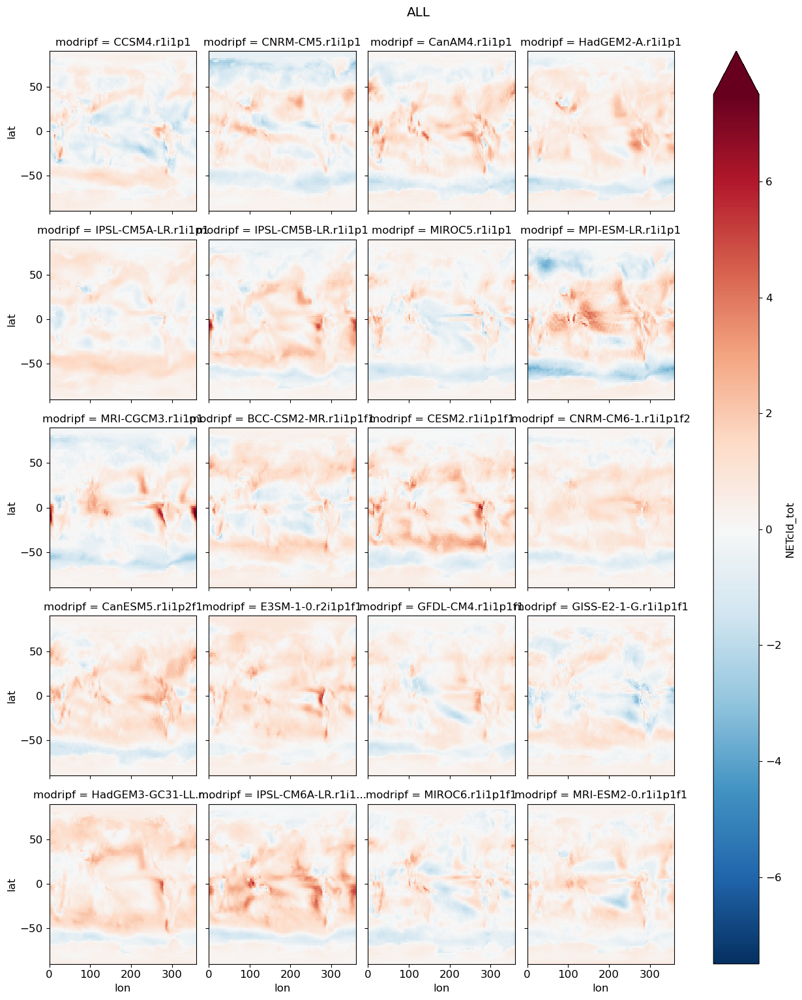

<Figure size 1200x1200 with 0 Axes>

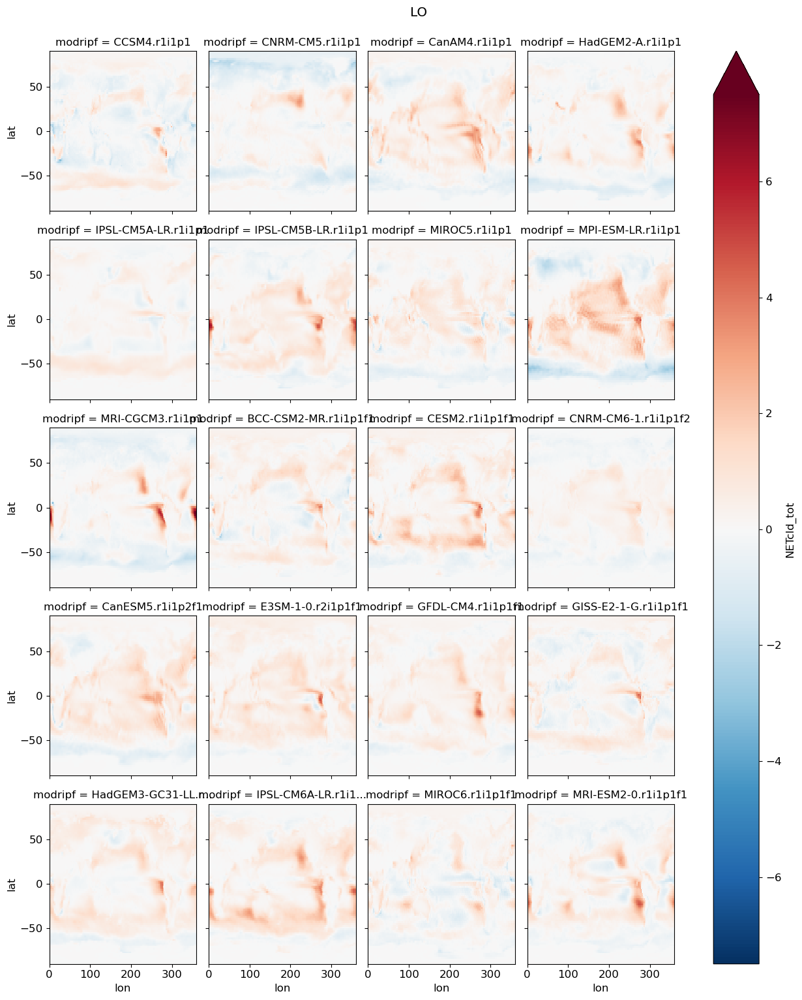

<Figure size 1200x1200 with 0 Axes>

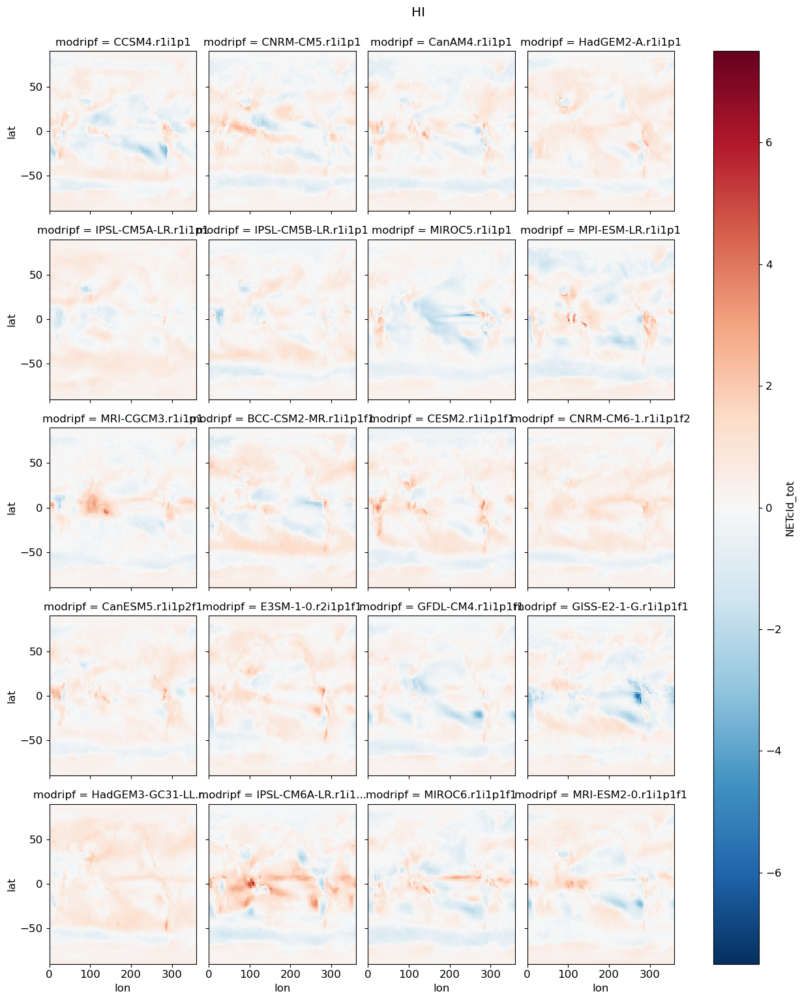

<Figure size 1200x1200 with 0 Axes>

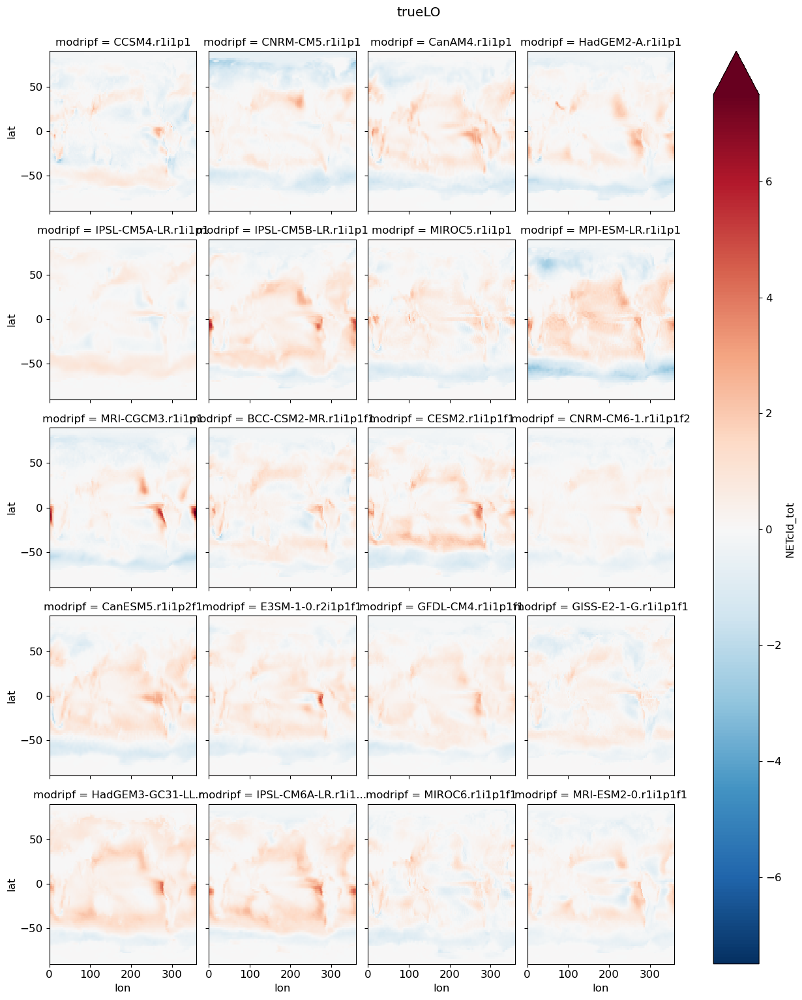

<Figure size 1200x1200 with 0 Axes>

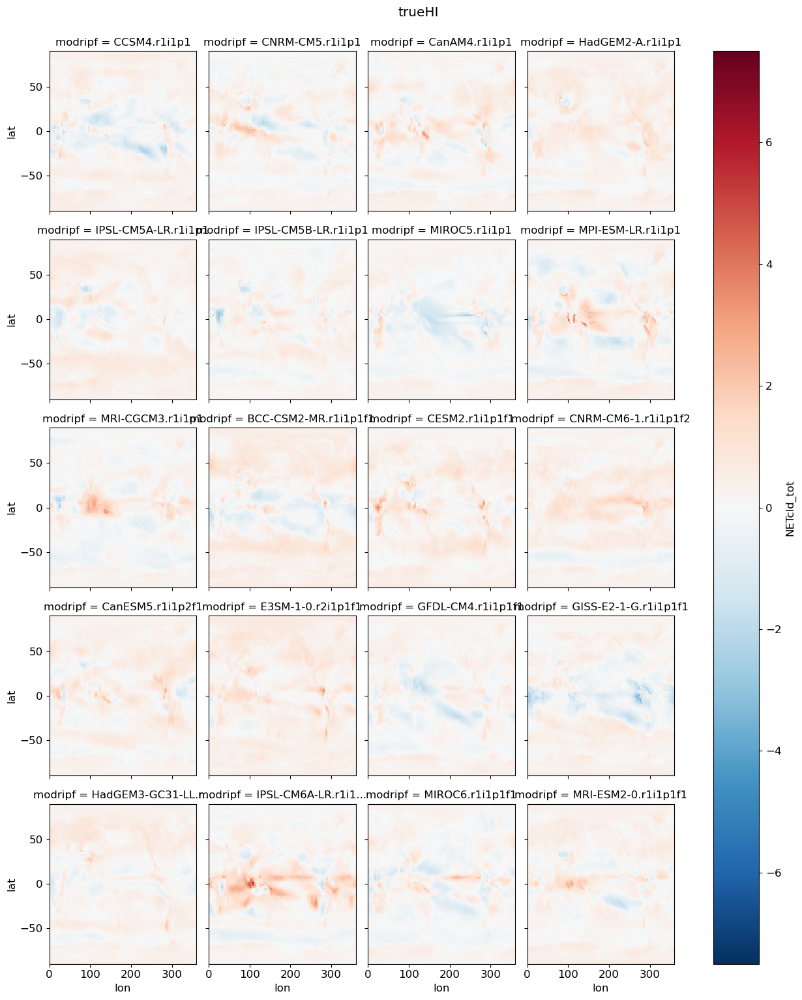

In [12]:
MAPS={}
AVGS={}
DSnames = ['ALL','LO','HI','trueLO','trueHI']
# for d,DS in enumerate([ALL,LO,HI,trueLO,trueHI]):
for sec in DSnames:
    plt.figure(figsize=(12,12))
    # sec = DSnames[d]
    gg=glob.glob('/p/user_pub/climate_work/zelinka1/cmip*/amip*4K/*.'+sec+'_fbks.nc')
    gg.sort()
    modripfs=[]
    winners=[]
    for g in gg:
        model = g.split('/')[-1].split('.')[0]
        member = g.split('/')[-1].split('.')[1]   
        if model=='IPSL-CM6A-LR' and member=='r22i1p1f1': # include only one IPSL-CM6A-LR model variant
            continue
        modripfs.append(model+'.'+member)
        winners.append(g)

    ds0 = xr.open_mfdataset(winners, concat_dim = 'modripf', combine = 'nested')#,coords='minimal')#,compat='override',decode_times=False)
    C = ds0.coords
    # Give model info to the model dimension
    ds = ds0.assign_coords({
        'modripf': modripfs,
        'time': C['time'],
        'lat': C['lat'],
        'lon': C['lon'],
    })
    ds.mean('time')['NETcld_tot'].plot(col='modripf',col_wrap=4,vmin=-7.5,vmax=7.5,cmap='RdBu_r')
    plt.suptitle(sec,y=1.02)

    # compute global averages:
    AVGS[sec] = global_avgs(ds)
    MAPS[sec] = ds.mean('time')

In [13]:
endline=r"\\"
for w in winners:
    era = w.split('/')[5]
    exp = w.split('/')[6]
    this = w.split('/')[7]
    model = this.split('.')[0]
    ripf = this.split('.')[1]   
    print('CMIP'+era[-1]+' & '+model+' & '+ripf+' & '+exp+' '+endline)

CMIP5 & CCSM4 & r1i1p1 & amip4K \\
CMIP5 & CNRM-CM5 & r1i1p1 & amip4K \\
CMIP5 & CanAM4 & r1i1p1 & amip4K \\
CMIP5 & HadGEM2-A & r1i1p1 & amip4K \\
CMIP5 & IPSL-CM5A-LR & r1i1p1 & amip4K \\
CMIP5 & IPSL-CM5B-LR & r1i1p1 & amip4K \\
CMIP5 & MIROC5 & r1i1p1 & amip4K \\
CMIP5 & MPI-ESM-LR & r1i1p1 & amip4K \\
CMIP5 & MRI-CGCM3 & r1i1p1 & amip4K \\
CMIP6 & BCC-CSM2-MR & r1i1p1f1 & amip-p4K \\
CMIP6 & CESM2 & r1i1p1f1 & amip-p4K \\
CMIP6 & CNRM-CM6-1 & r1i1p1f2 & amip-p4K \\
CMIP6 & CanESM5 & r1i1p2f1 & amip-p4K \\
CMIP6 & E3SM-1-0 & r2i1p1f1 & amip-p4K \\
CMIP6 & GFDL-CM4 & r1i1p1f1 & amip-p4K \\
CMIP6 & GISS-E2-1-G & r1i1p1f1 & amip-p4K \\
CMIP6 & HadGEM3-GC31-LL & r5i1p1f3 & amip-p4K \\
CMIP6 & IPSL-CM6A-LR & r1i1p1f1 & amip-p4K \\
CMIP6 & MIROC6 & r1i1p1f1 & amip-p4K \\
CMIP6 & MRI-ESM2-0 & r1i1p1f1 & amip-p4K \\


In [14]:
MAPS[sec]

<xarray.Dataset> Size: 31MB
Dimensions:     (modripf: 20, lat: 90, lon: 144)
Coordinates:
  * lat         (lat) float64 720B -89.0 -87.0 -85.0 -83.0 ... 85.0 87.0 89.0
  * lon         (lon) float64 1kB 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * modripf     (modripf) <U24 2kB 'CCSM4.r1i1p1' ... 'MRI-ESM2-0.r1i1p1f1'
Data variables: (12/15)
    LWcld_tot   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    SWcld_tot   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    NETcld_tot  (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    LWcld_amt   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    SWcld_amt   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    NETcld_amt  (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    ...          ...
    LWcld_tau   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    SWcld_tau   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    NETcld_tau  (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    LWcld_err   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    SWcld_err   (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>
    NETcld_err  (modripf, lat, lon) float64 2MB dask.array<chunksize=(1, 90, 144), meta=np.ndarray>

In [15]:
modripfs = MAPS['ALL'].modripf
modripfs5=[]
modripfs6=[]
for modripf in modripfs:
    mr = str(modripf.values)
    ripf = mr.split('.')[-1]
    if 'f' in ripf:
        modripfs6.append(mr)
    else:
        modripfs5.append(mr)
modripfs5,modripfs6

(['CCSM4.r1i1p1',
  'CNRM-CM5.r1i1p1',
  'CanAM4.r1i1p1',
  'HadGEM2-A.r1i1p1',
  'IPSL-CM5A-LR.r1i1p1',
  'IPSL-CM5B-LR.r1i1p1',
  'MIROC5.r1i1p1',
  'MPI-ESM-LR.r1i1p1',
  'MRI-CGCM3.r1i1p1'],
 ['BCC-CSM2-MR.r1i1p1f1',
  'CESM2.r1i1p1f1',
  'CNRM-CM6-1.r1i1p1f2',
  'CanESM5.r1i1p2f1',
  'E3SM-1-0.r2i1p1f1',
  'GFDL-CM4.r1i1p1f1',
  'GISS-E2-1-G.r1i1p1f1',
  'HadGEM3-GC31-LL.r5i1p1f3',
  'IPSL-CM6A-LR.r1i1p1f1',
  'MIROC6.r1i1p1f1',
  'MRI-ESM2-0.r1i1p1f1'])

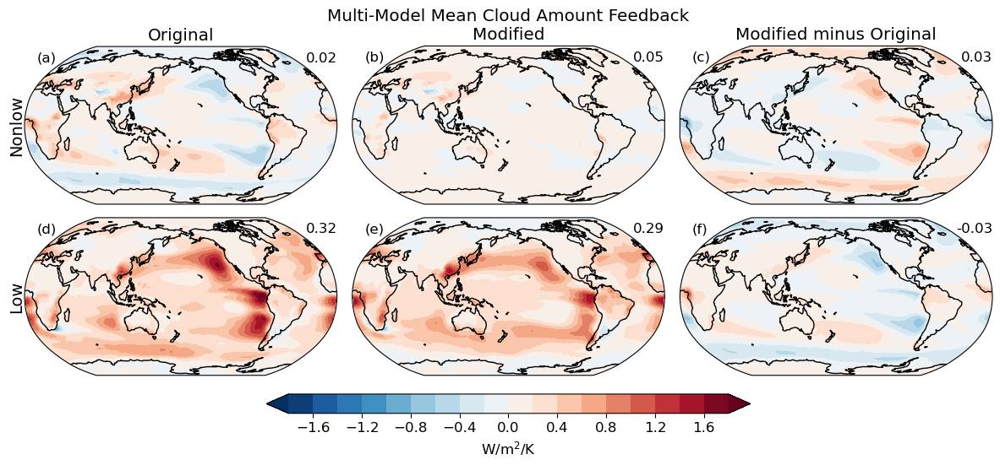

In [16]:
var='NETcld_amt'
lons = MAPS['LO'].lon
lats = MAPS['LO'].lat
LEVELS = np.arange(-1.8,2.0,0.2)
modripfs=modripfs5+modripfs6
fig, axs = plt.subplots(2, 3, figsize=(12,6), subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

axs = axs.flatten()

ax=axs[0]
A=MAPS['HI'].mean('modripf')
A2 = A.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(0, 0.5,'Nonlow', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('Original')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[1]
B=MAPS['trueHI'].mean('modripf')
A2 = B.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.set_title('Multi-Model Mean Cloud Amount Feedback\nModified')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(b)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[2]
C = B-A
A2 = C.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
pl=ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.set_title('Modified minus Original')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(c)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[3]
A=MAPS['LO'].mean('modripf')
A2 = A.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(0, 0.5,'Low', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(d)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[4]
B=MAPS['trueLO'].mean('modripf')
A2 = B.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(e)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[5]
C = B-A
A2 = C.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(f)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

# Adjust layout
plt.tight_layout()#h_pad=0.0)

# Add a single colorbar at bottom
cbar = plt.colorbar(pl, ax=axs, orientation='horizontal', pad = 0.04, shrink = 0.5, aspect = 25)
cbar.set_label(UNITS)
plt.savefig(figdir+'MMM_cldamt_fbk_maps.pdf',bbox_inches='tight')


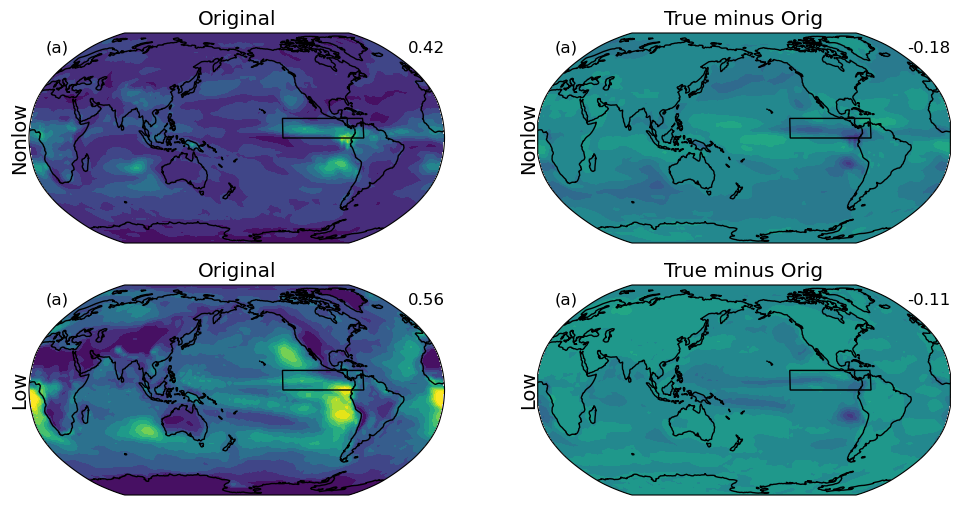

In [17]:
import matplotlib.patches as mpatches
LEVELS1 = np.arange(0,1.3,0.1)
LEVELS2 = np.arange(-0.8,0.9,0.1)

# Peru:
REG='Peru Region'
latmin=-30
latmax=10
# latmax=-10
# lonmin=360-100
lonmin=360-140
lonmax=360-70

# EPAC ITCZ
REG='Eastern Pacific ITCZ'
latmin=0
latmax=15
lonmin=360-140
lonmax=360-70

lat_bounds=(latmin,latmax)
lon_bounds=(lonmin,lonmax)
dx,dy = lonmax-lonmin,latmax-latmin

fig, axs = plt.subplots(2,2, figsize=(12,6), subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

ax = axs[0, 0]
A1 = MAPS['HI'].std('modripf')
A2 = A1.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
REGavg=A2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),extend='both')
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS1,extend='max')#,cmap='RdBu_r')
ax.text(0, 0.5,'Nonlow', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('Original')
ax.text(1,0.93,np.round(REGavg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax = axs[0, 1]
A1 = MAPS['trueHI'].std('modripf') - MAPS['HI'].std('modripf')
A2 = A1.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
REGavg=A2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),extend='both')
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS2,extend='both')#,cmap='RdBu_r')
ax.text(0, 0.5,'Nonlow', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('True minus Orig')
ax.text(1,0.93,np.round(REGavg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax = axs[1, 0]
A1 = MAPS['LO'].std('modripf')
A2 = A1.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
REGavg=A2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),extend='both')
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS1,extend='max')#,cmap='RdBu_r')
ax.text(0, 0.5,'Low', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('Original')
ax.text(1,0.93,np.round(REGavg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax = axs[1, 1] 
A1 = MAPS['trueLO'].std('modripf') - MAPS['LO'].std('modripf')
A2 = A1.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
REGavg=A2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),extend='both')
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS2,extend='both')#,cmap='RdBu_r')
ax.text(0, 0.5,'Low', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('True minus Orig')
ax.text(1,0.93,np.round(REGavg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

<Figure size 1200x900 with 0 Axes>

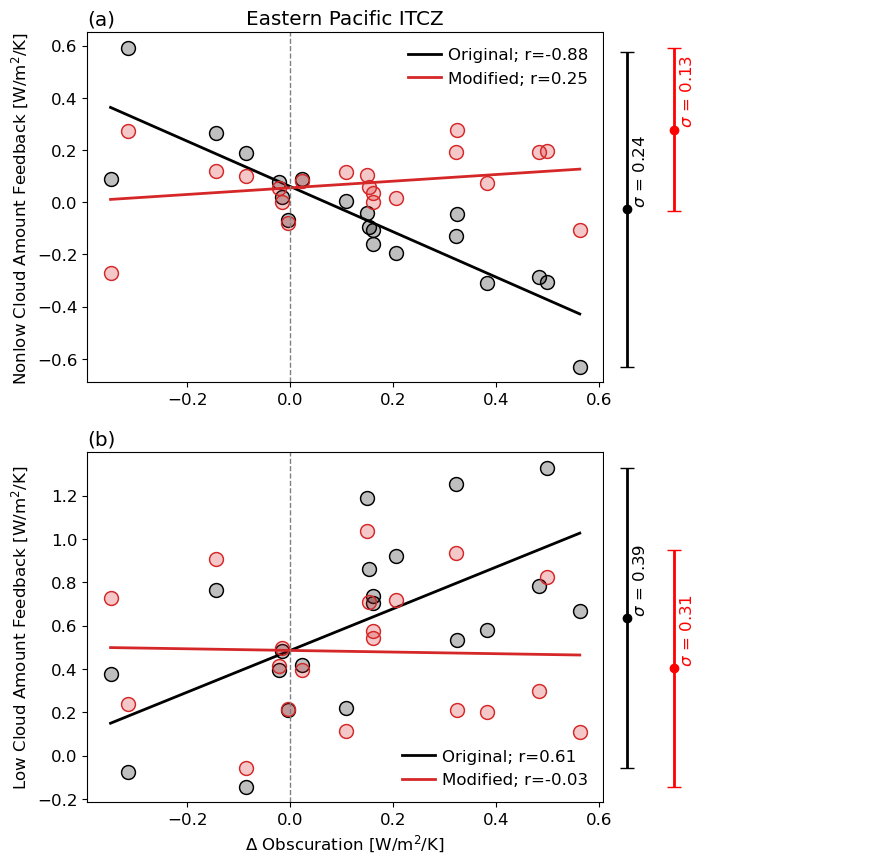

In [18]:
var='NETcld_amt'
plt.figure(figsize=(12,9))
A = MAPS['LO'] 
B=MAPS['trueLO']
C = A-B # = ∆obsc
D = MAPS['HI'] 
E=MAPS['trueHI']
A2 = A.bounds.add_missing_bounds()
B2 = B.bounds.add_missing_bounds()
C2 = C.bounds.add_missing_bounds()
D2 = D.bounds.add_missing_bounds()
E2 = E.bounds.add_missing_bounds()
lo=A2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
truelo=B2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
ob=C2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
hi=D2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values
truehi=E2.spatial.average(var, lat_bounds=lat_bounds, lon_bounds=lon_bounds, axis=["X", "Y"])[var].values

fig, axs = plt.subplots(2, 2, figsize=(10, 10), gridspec_kw={'height_ratios': [1, 1], 'width_ratios': [2, 1]})

# Plot 1: Scatter plot of y1 vs x and y2 vs x
for row in range(2):
    if row==0:
        x,y1,y2 = ob,hi,truehi
        name = 'Nonlow'
    else:
        x,y1,y2 = ob,lo,truelo
        name = 'Low'
    dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
    ax1 = axs[row, 0]
    ax1.plot(x, y1,marker='o',ms=10,ls='',mec='k',mfc='k',alpha=0.25)
    ax1.plot(x, y1,marker='o',ms=10,ls='',mec='k',mfc='None')
    m, b, r, p, std_err = linregress(x,y1)
    ax1.plot(dummy,m*dummy+b,'k',label='Original; r='+str(np.round(r,2)))  
    ax1.plot(x, y2,marker='o',ms=10,ls='',mec='C3',mfc='C3',alpha=0.25)
    ax1.plot(x, y2,marker='o',ms=10,ls='',mec='C3',mfc='None')
    m, b, r, p, std_err = linregress(x,y2)
    ax1.plot(dummy,m*dummy+b,'C3',label='Modified; r='+str(np.round(r,2)))   
    ax1.legend()
    
    if row==1:
        ax1.set_xlabel('$\Delta$ Obscuration [W/m$^2$/K]')
    ax1.set_ylabel(name+' Cloud Amount Feedback [W/m$^2$/K]')
    if row==0:
        ax1.set_title(REG)
        ax1.set_title('(a)',loc='left')
    else:
        ax1.set_title('(b)',loc='left')
    ax1.axvline(x=0,color='gray',ls='--',lw=1)
    
    # Plot 2: Error bars for y1 and y2
    ax2 = axs[row, 1]
    ax2.errorbar(1, np.mean(y1), yerr=np.std(y1), fmt='o', color='k', capsize=5)
    ax2.errorbar(2, np.mean(y2), yerr=np.std(y2), fmt='o', color='r', capsize=5)
    ax2.set_xlim([0.5, 6])
    ax2.text(1.1,np.mean(y1),' $\sigma$ = '+str(np.round(np.std(y1),2)),color='k',rotation=90)
    ax2.text(2.1,np.mean(y2),' $\sigma$ = '+str(np.round(np.std(y2),2)),color='r',rotation=90)
    
    # Adjust layout to position ax2 to the right of ax1
    fig.subplots_adjust(wspace=0.002)  # Reduce horizontal space between subplots
    # ax1.spines['right'].set_visible(False)  # Hide right spine of ax1
    ax2.spines['left'].set_visible(False)   # Hide left spine of ax2
    ax2.spines['right'].set_visible(False)   # Hide left spine of ax2
    ax2.spines['top'].set_visible(False)   # Hide left spine of ax2
    ax2.spines['bottom'].set_visible(False)   # Hide left spine of ax2
    # ax2.yaxis.tick_right()  # Move y-axis ticks and labels to the right side of ax2
    
    # Remove x-label and ticks from ax2
    ax2.set_yticklabels([])  # Remove y-tick labels
    ax2.set_xticklabels([])  # Remove x-tick labels
    ax2.tick_params(axis='y', which='both', length=0)  # Remove y-ticks
    ax2.tick_params(axis='x', which='both', length=0)  # Remove x-ticks
plt.savefig(figdir+'EPAC_cldfbk_dobcs_scat.pdf',bbox_inches='tight')


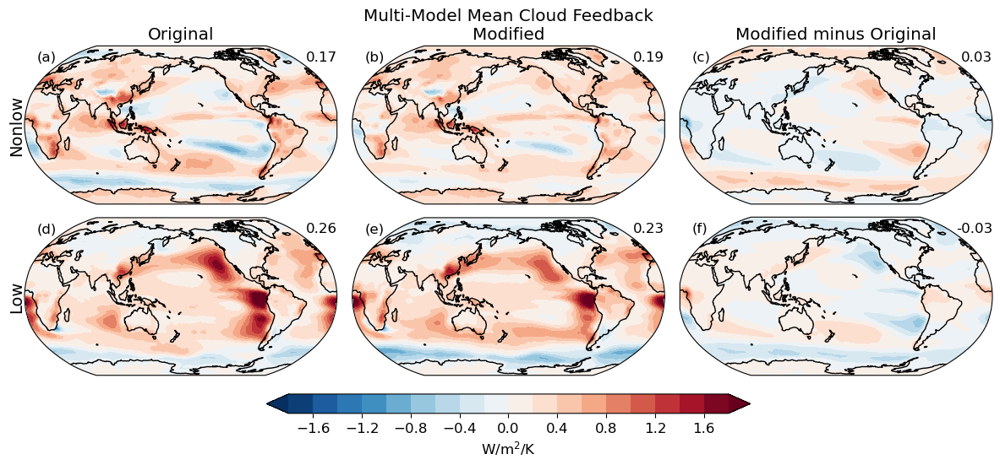

In [19]:
var='NETcld_tot'
lons = MAPS['LO'].lon
lats = MAPS['LO'].lat
LEVELS = np.arange(-1.8,2.0,0.2)
modripfs=modripfs5+modripfs6
fig, axs = plt.subplots(2, 3, figsize=(12,6), subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})

axs = axs.flatten()

ax=axs[0]
A=MAPS['HI'].mean('modripf')
A2 = A.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(0, 0.5,'Nonlow', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('Original')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[1]
B=MAPS['trueHI'].mean('modripf')
A2 = B.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.set_title('Multi-Model Mean Cloud Feedback\nModified')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(b)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[2]
C = B-A
A2 = C.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
pl=ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.set_title('Modified minus Original')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(c)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[3]
A=MAPS['LO'].mean('modripf')
A2 = A.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(0, 0.5,'Low', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(d)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[4]
B=MAPS['trueLO'].mean('modripf')
A2 = B.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(e)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

ax=axs[5]
C = B-A
A2 = C.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A2[var], transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(f)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 

# Adjust layout
plt.tight_layout()#h_pad=0.0)

# Add a single colorbar at bottom
cbar = plt.colorbar(pl, ax=axs, orientation='horizontal', pad = 0.04, shrink = 0.5, aspect = 25)
cbar.set_label(UNITS)
plt.savefig(figdir+'MMM_cldtot_fbk_maps.pdf',bbox_inches='tight')


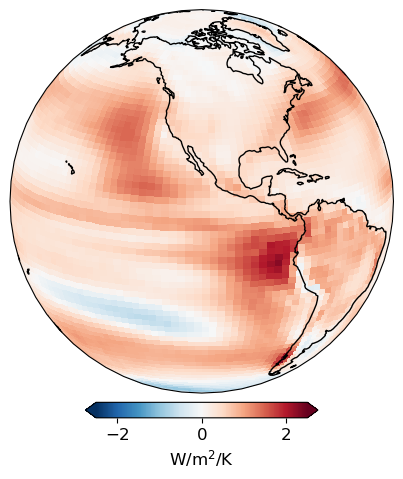

In [20]:
# same, but show on sphere
var='NETcld_tot'
lons = MAPS['ALL'].lon
lats = MAPS['ALL'].lat
LEVELS = np.arange(-1.8,2.0,0.2)
modripfs=modripfs5+modripfs6
ax=axs[0]
A=MAPS['ALL'].mean('modripf')

fig = plt.figure(figsize = (6, 6))
map_projection = ccrs.NearsidePerspective
axes = fig.subplots(nrows=1, subplot_kw={'projection': map_projection(satellite_height=9000000000.0, central_longitude=-110, central_latitude=15)})

pl = A[var].plot(ax = axes,transform=ccrs.PlateCarree(),
                          cmap = 'RdBu_r',vmin = -2.5,vmax = 2.5,extend='both',
                          add_colorbar=False)
axes.set_title("")
axes.coastlines(resolution='110m')
fig.colorbar(pl, ax=axes, pad = 0.02, shrink = 0.5, aspect = 15,extend = 'both',label='W/m$^2$/K',orientation='horizontal')


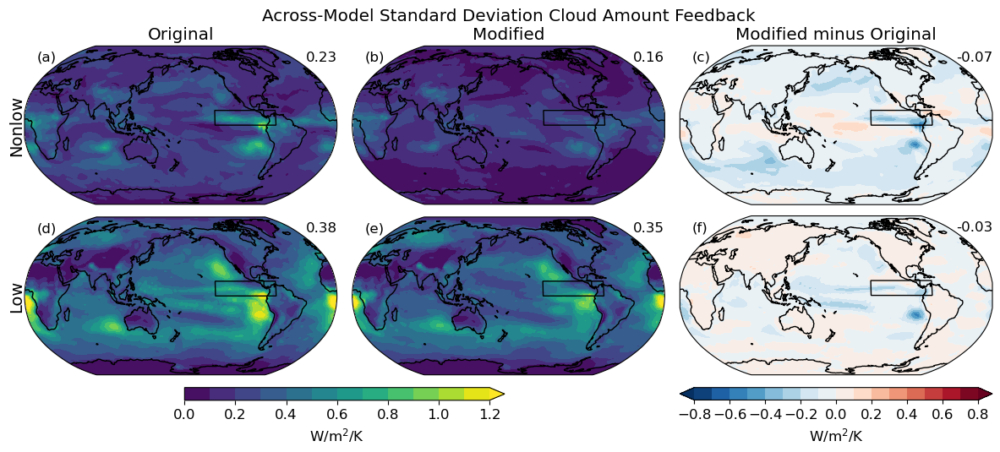

In [47]:
lons = MAPS['LO'].lon
lats = MAPS['LO'].lat
LEVELS1 = np.arange(0,1.3,0.1)
LEVELS2 = np.arange(-0.8,0.9,0.1)
modripfs=modripfs5+modripfs6
fig, axs = plt.subplots(2, 3, figsize=(12,6), subplot_kw={'projection': ccrs.Robinson(central_longitude=180)})
axs = axs.flatten()

var = 'NETcld_amt'

ax=axs[0]
A=MAPS['HI'].std('modripf')
A2 = A.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A[var], transform=ccrs.PlateCarree(),levels=LEVELS1,extend='max')#,cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0, 0.5,'Nonlow', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.set_title('Original')
ax.text(0.04,0.93,'(a)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax=axs[1]
B=MAPS['trueHI'].std('modripf')
A2 = B.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, B[var], transform=ccrs.PlateCarree(),levels=LEVELS1,extend='max')#,cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.set_title('Across-Model Standard Deviation Cloud Amount Feedback\nModified')
ax.text(0.04,0.93,'(b)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax=axs[2]
C = B-A
A2 = C.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
pl=ax.contourf(lons, lats, C[var], transform=ccrs.PlateCarree(),levels=LEVELS2,extend='both',cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.set_title('Modified minus Original')
ax.text(0.04,0.93,'(c)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax=axs[3]
A=MAPS['LO'].std('modripf')
A2 = A.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
ax.contourf(lons, lats, A[var], transform=ccrs.PlateCarree(),levels=LEVELS1,extend='max')#,cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0, 0.5,'Low', fontsize=14, ha='right', va='center', rotation=90, transform=ax.transAxes) # no clue why set_ylabel doesn't work
ax.text(0.04,0.93,'(d)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax=axs[4]
B=MAPS['trueLO'].std('modripf')
A2 = B.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
pl1=ax.contourf(lons, lats, B[var], transform=ccrs.PlateCarree(),levels=LEVELS1,extend='max')#,cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(e)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

ax=axs[5]
C = B-A
A2 = C.bounds.add_missing_bounds()
avg=A2.spatial.average(var, axis=["X", "Y"])[var].values
ax.coastlines()
pl2=ax.contourf(lons, lats, C[var], transform=ccrs.PlateCarree(),levels=LEVELS2,extend='both',cmap='RdBu_r')
ax.text(1,0.93,np.round(avg,2),fontsize=12, ha='right', va='center', transform=ax.transAxes) 
ax.text(0.04,0.93,'(f)',fontsize=12, ha='left', va='center', transform=ax.transAxes) 
ax.add_patch(mpatches.Rectangle(xy=[lonmin,latmin], width=dx, height=dy,facecolor='none',edgecolor='k',transform=ccrs.PlateCarree()))

# Adjust layout
plt.tight_layout(h_pad=-7.5)

# Add a single horizontal colorbar for the first two columns
cbar=fig.colorbar(pl1, ax=axs[3:5], orientation='horizontal', pad = 0.04, shrink = 0.5, aspect = 25)
cbar.set_label(UNITS)

# Add a horizontal colorbar for the last column below it
cbar=fig.colorbar(pl2, ax=axs[5], orientation='horizontal', pad = 0.04, aspect = 25)
cbar.set_label(UNITS)
plt.savefig(figdir+'MMstd_cldamt_fbk_maps.pdf',bbox_inches='tight')

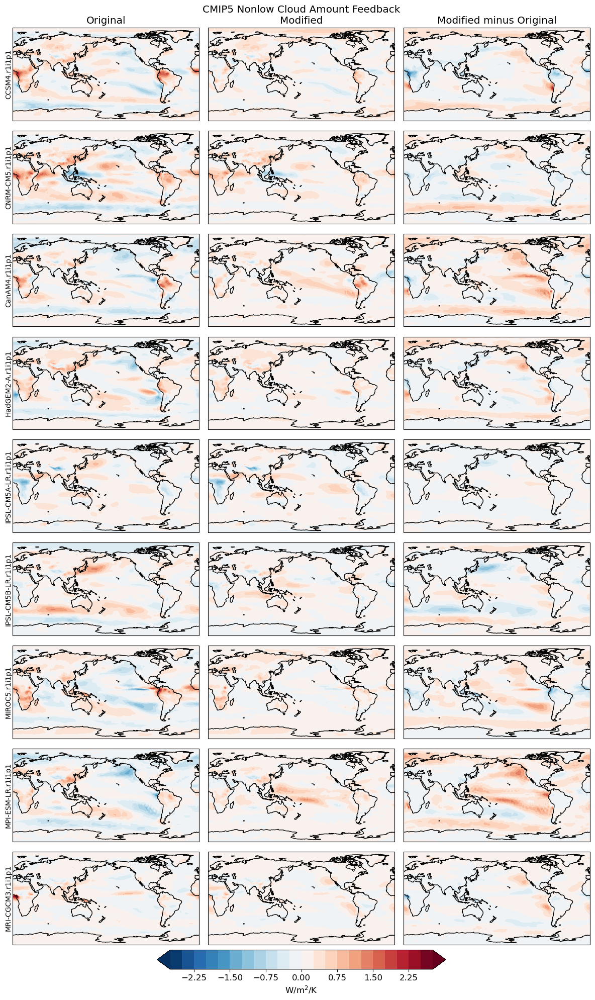

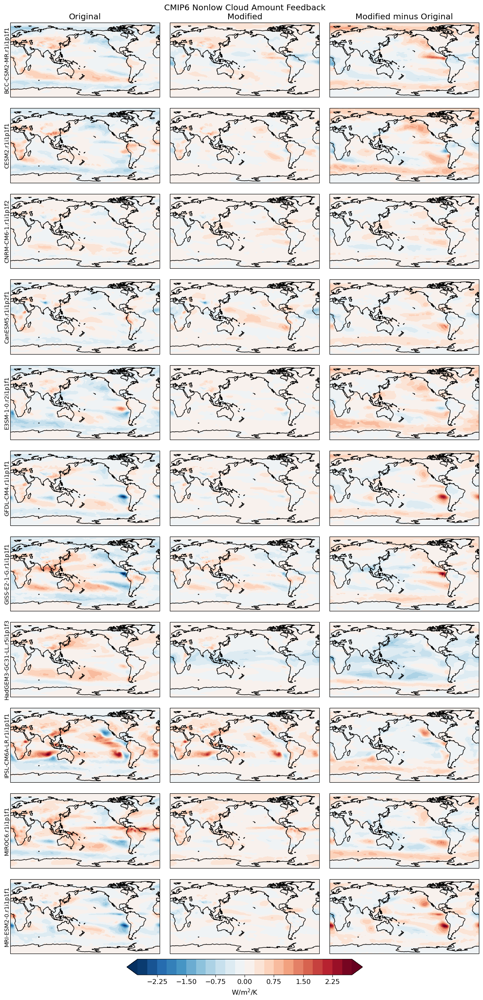

In [23]:
lons = MAPS['LO'].lon
lats = MAPS['LO'].lat
LEVELS = np.arange(-2.75,3.0,0.25)
for era in ['CMIP5','CMIP6']:
    if era=='CMIP5':
        modripfs=modripfs5
    else:
        modripfs=modripfs6
    LM = len(modripfs)
    fig, axs = plt.subplots(LM, 3, figsize=(12,2.5*LM), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
    axs = axs.flatten()

    cnt=-1
    for m,mo in enumerate(modripfs):
        cnt+=1
        ax=axs[cnt]
        A=MAPS['HI'].sel(modripf=mo)['NETcld_amt']
        ax.coastlines()
        ax.contourf(lons, lats, A, transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
        ax.text(-180, 0,mo, fontsize=10, ha='right', va='center', rotation=90) # no clue why set_ylabel doesn't work
        if m==0: # if we are in the first row:
            ax.set_title('Original')

        cnt+=1
        ax=axs[cnt]
        B=MAPS['trueHI'].sel(modripf=mo)['NETcld_amt']
        ax.coastlines()
        ax.contourf(lons, lats, B, transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
        if m==0: # if we are in the first row:
            ax.set_title(era+' Nonlow Cloud Amount Feedback\nModified')

        cnt+=1
        ax=axs[cnt]
        C = B-A
        ax.coastlines()
        pl=ax.contourf(lons, lats, C, transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
        if m==0: # if we are in the first row:
            ax.set_title('Modified minus Original')

    # Adjust layout
    plt.tight_layout()#h_pad=0.2)

    # Add a single colorbar at bottom
    cbar = plt.colorbar(pl, ax=axs, orientation='horizontal', pad = 0.005, shrink = 0.5, aspect = 15)
    cbar.set_label(UNITS)
    plt.savefig(figdir+era+'hi_cldamt_fbk_maps.pdf',bbox_inches='tight')


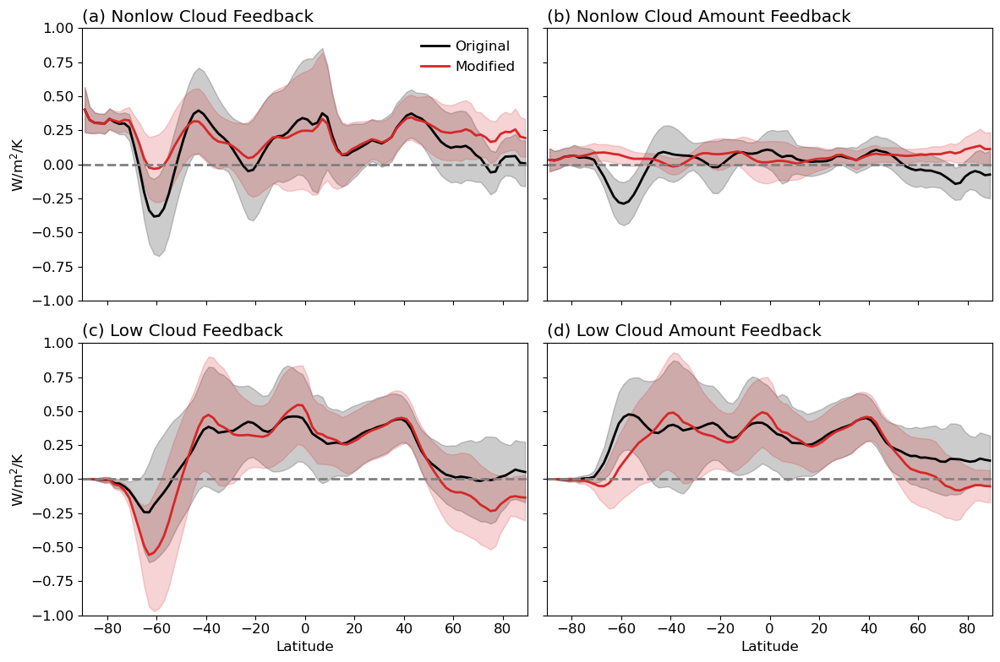

In [24]:
fig, axs = plt.subplots(2, 2, figsize=(12,8), sharex=True, sharey=True)

j=0,0
A=MAPS['HI']['NETcld_tot'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='k', label='Original')
axs[j].fill_between(lats, upper_bound, lower_bound, color='k', alpha=0.2)
A=MAPS['trueHI']['NETcld_tot'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='C3', label='Modified')
axs[j].fill_between(lats, upper_bound, lower_bound, color='C3', alpha=0.2)
axs[j].set_xlim(-90,90)
axs[j].set_ylim(-1,1)
axs[j].set_ylabel(UNITS)
axs[j].axhline(y=0,ls='--',color='gray')
axs[j].legend()
axs[j].set_title('(a) Nonlow Cloud Feedback',loc='left')

j=0,1
A=MAPS['HI']['NETcld_amt'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='k', label='Original')
axs[j].fill_between(lats, upper_bound, lower_bound, color='k', alpha=0.2)
A=MAPS['trueHI']['NETcld_amt'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='C3', label='Modified')
axs[j].fill_between(lats, upper_bound, lower_bound, color='C3', alpha=0.2)
axs[j].set_xlim(-90,90)
axs[j].set_ylim(-1,1)
# axs[j].set_ylabel(UNITS)
axs[j].axhline(y=0,ls='--',color='gray')
# axs[j].legend()
axs[j].set_title('(b) Nonlow Cloud Amount Feedback',loc='left')

j=1,0
A=MAPS['LO']['NETcld_tot'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='k', label='Original')
axs[j].fill_between(lats, upper_bound, lower_bound, color='k', alpha=0.2)
A=MAPS['trueLO']['NETcld_tot'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='C3', label='Modified')
axs[j].fill_between(lats, upper_bound, lower_bound, color='C3', alpha=0.2)
axs[j].set_xlim(-90,90)
axs[j].set_ylim(-1,1)
axs[j].set_ylabel(UNITS)
axs[j].set_xlabel('Latitude')
axs[j].axhline(y=0,ls='--',color='gray')
# axs[j].legend()
axs[j].set_title('(c) Low Cloud Feedback',loc='left')

j=1,1
A=MAPS['LO']['NETcld_amt'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='k', label='Original')
axs[j].fill_between(lats, upper_bound, lower_bound, color='k', alpha=0.2)
A=MAPS['trueLO']['NETcld_amt'].mean('lon')
mean = A.mean('modripf')
std = A.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
axs[j].plot(lats, mean, color='C3', label='Modified')
axs[j].fill_between(lats, upper_bound, lower_bound, color='C3', alpha=0.2)
axs[j].set_xlim(-90,90)
axs[j].set_ylim(-1,1)
# axs[j].set_ylabel(UNITS)
axs[j].set_xlabel('Latitude')
axs[j].axhline(y=0,ls='--',color='gray')
# axs[j].legend()
axs[j].set_title('(d) Low Cloud Amount Feedback',loc='left')

plt.tight_layout()
plt.savefig(figdir+'ZM_cld_fbk.pdf',bbox_inches='tight')

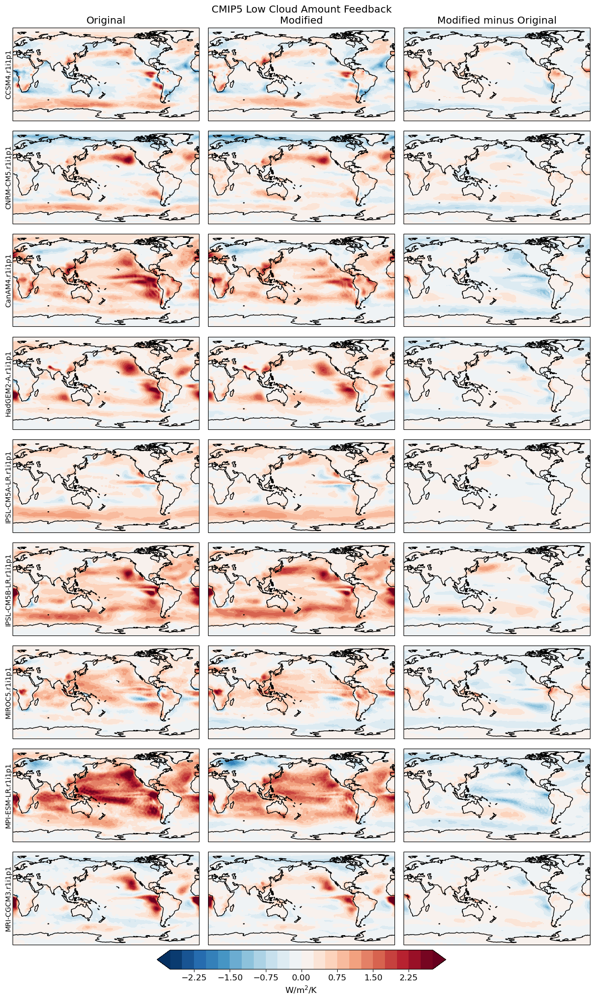

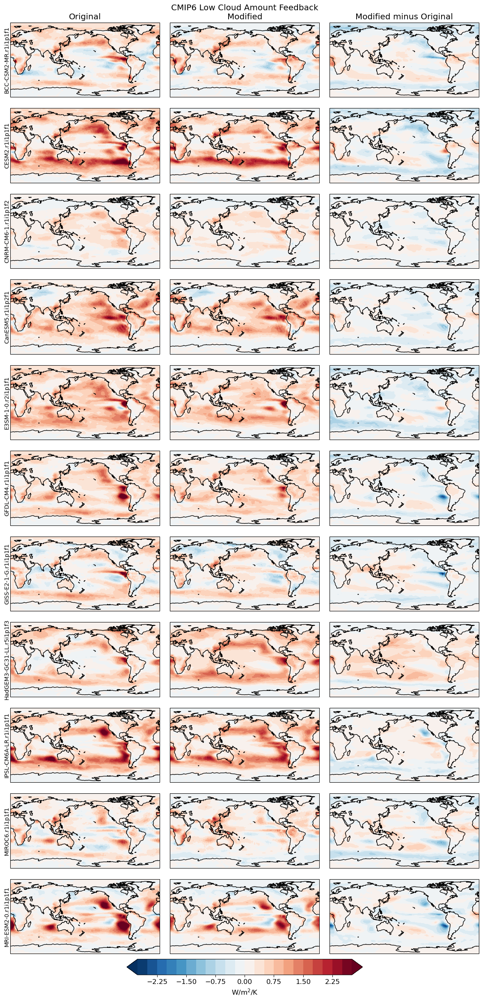

In [25]:
lons = MAPS['LO'].lon
lats = MAPS['LO'].lat
LEVELS = np.arange(-2.75,3.0,0.25)
for era in ['CMIP5','CMIP6']:
    if era=='CMIP5':
        modripfs=modripfs5
    else:
        modripfs=modripfs6
    LM = len(modripfs)
    fig, axs = plt.subplots(LM, 3, figsize=(12,2.5*LM), subplot_kw={'projection': ccrs.PlateCarree(central_longitude=180)})
    axs = axs.flatten()

    cnt=-1
    for m,mo in enumerate(modripfs):
        cnt+=1
        ax=axs[cnt]
        A=MAPS['LO'].sel(modripf=mo)['NETcld_amt']
        ax.coastlines()
        ax.contourf(lons, lats, A, transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
        ax.text(-180, 0,mo, fontsize=10, ha='right', va='center', rotation=90) # no clue why set_ylabel doesn't work
        if m==0: # if we are in the first row:
            ax.set_title('Original')

        cnt+=1
        ax=axs[cnt]
        B=MAPS['trueLO'].sel(modripf=mo)['NETcld_amt']
        ax.coastlines()
        ax.contourf(lons, lats, B, transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
        if m==0: # if we are in the first row:
            ax.set_title(era+' Low Cloud Amount Feedback\nModified')

        cnt+=1
        ax=axs[cnt]
        C = B-A
        ax.coastlines()
        pl=ax.contourf(lons, lats, C, transform=ccrs.PlateCarree(),levels=LEVELS,extend='both',cmap='RdBu_r')
        if m==0: # if we are in the first row:
            ax.set_title('Modified minus Original')


    # Adjust layout
    plt.tight_layout()#h_pad=0.2)

    # Add a single colorbar at bottom
    cbar = plt.colorbar(pl, ax=axs, orientation='horizontal', pad = 0.005, shrink = 0.5, aspect = 15)
    cbar.set_label(UNITS)
    plt.savefig(figdir+era+'lo_cldamt_fbk_maps.pdf',bbox_inches='tight')

Text(0.0, 1.0, 'Cloud Amount Feedbacks')

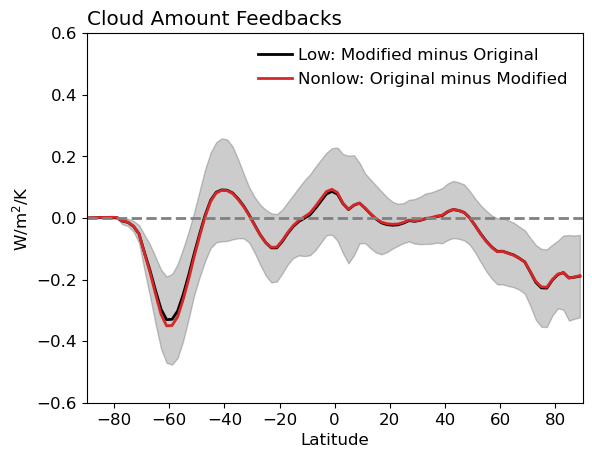

In [26]:
A=MAPS['HI']['NETcld_amt'].mean('lon')
B=MAPS['trueHI']['NETcld_amt'].mean('lon')
C1 = A-B
A=MAPS['LO']['NETcld_amt'].mean('lon')
B=MAPS['trueLO']['NETcld_amt'].mean('lon')
C2 = B-A
mean = C2.mean('modripf')
std = C2.std('modripf')
upper_bound = mean + std
lower_bound = mean - std
plt.plot(lats, C2.mean('modripf'), color='k', label='Low: Modified minus Original')
plt.plot(lats, C1.mean('modripf'), color='C3', ls='-', label='Nonlow: Original minus Modified')
plt.fill_between(lats, upper_bound, lower_bound, color='k', alpha=0.2)
plt.xlim(-90,90)
plt.ylim(-0.6,0.6)
plt.ylabel(UNITS)
plt.xlabel('Latitude')
plt.axhline(y=0,ls='--',color='gray')
plt.legend()
plt.title('Cloud Amount Feedbacks',loc='left')

Text(0, 0.5, 'original')

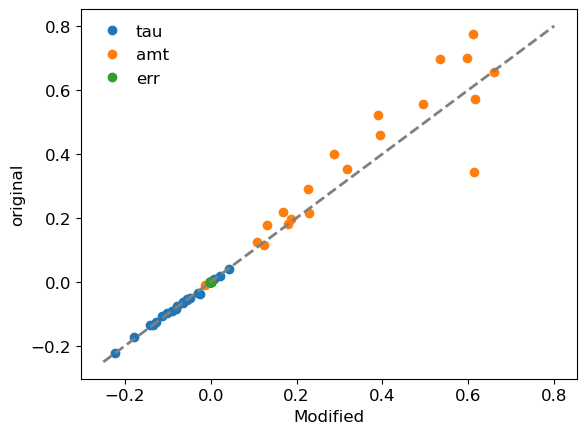

In [27]:
x,y = AVGS['trueLO'],AVGS['LO']
plt.plot(x['SWcld_tau'],y['SWcld_tau'],'o',label='tau')
plt.plot(x['SWcld_amt'],y['SWcld_amt'],'o',label='amt')
plt.plot(x['SWcld_err'],y['SWcld_err'],'o',label='err')
dummy=np.linspace(-0.25,0.8,10)
plt.plot(dummy,dummy,color='grey',ls='--')
plt.legend()
plt.xlabel('Modified')
plt.ylabel('original')

In [28]:
modripfs

['BCC-CSM2-MR.r1i1p1f1',
 'CESM2.r1i1p1f1',
 'CNRM-CM6-1.r1i1p1f2',
 'CanESM5.r1i1p2f1',
 'E3SM-1-0.r2i1p1f1',
 'GFDL-CM4.r1i1p1f1',
 'GISS-E2-1-G.r1i1p1f1',
 'HadGEM3-GC31-LL.r5i1p1f3',
 'IPSL-CM6A-LR.r1i1p1f1',
 'MIROC6.r1i1p1f1',
 'MRI-ESM2-0.r1i1p1f1']

In [29]:
modripfs = modripfs5+modripfs6

AVGS['ALL']['modripfs'] = modripfs
AVGS['LO']['modripfs'] = modripfs
AVGS['HI']['modripfs'] = modripfs
AVGS['trueLO']['modripfs'] = modripfs
AVGS['trueHI']['modripfs'] = modripfs

In [30]:
X = xr.Dataset({'x':(('modripf'),AVGS['ALL']['NETcld_tot'])},coords={'modripf': modripfs}) 
x = X['x']

Text(0.5, 1.0, 'a - b')

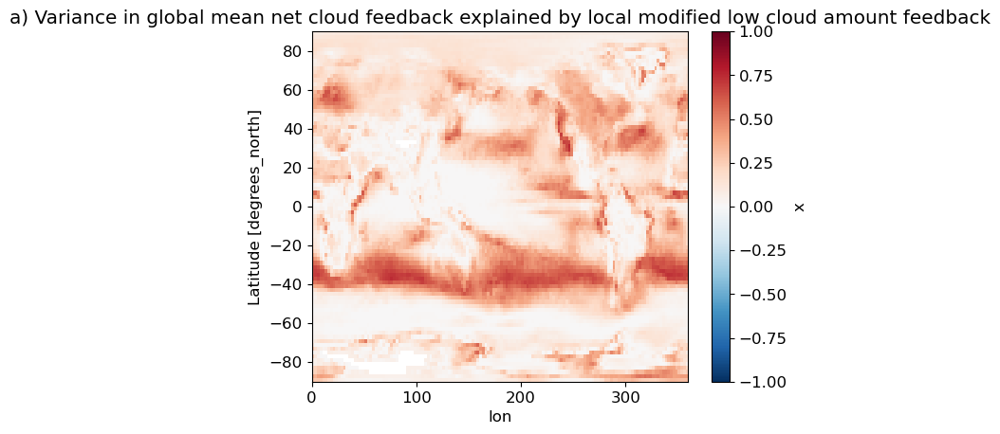

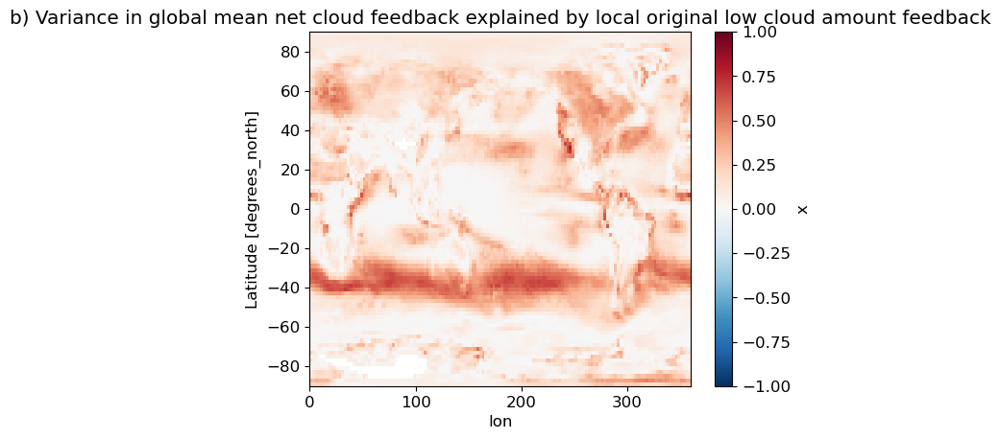

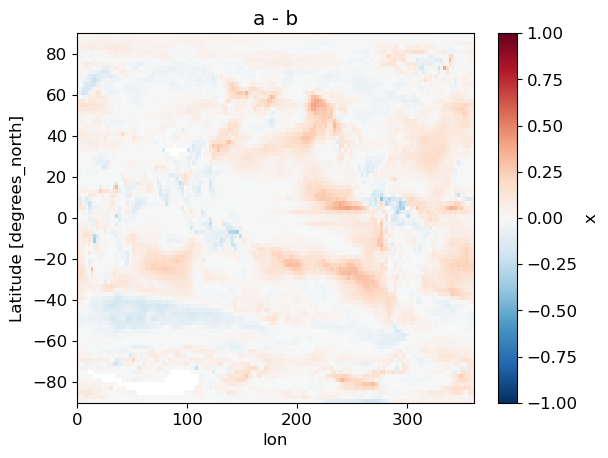

In [31]:
import xskillscore as xss

X = xr.Dataset({'x':(('modripf'),AVGS['ALL']['NETcld_tot'])},coords={'modripf': modripfs}) 
plt.subplots()
x = X['x']
y = MAPS['trueLO']['NETcld_amt'].chunk(modripf=-1)
R = xss.pearson_r(x, y, dim='modripf', weights=None, skipna=True, keep_attrs=True)
map1 = R**2
map1.plot(vmin=-1,vmax=1,cmap='RdBu_r')
plt.title('a) Variance in global mean net cloud feedback explained by local modified low cloud amount feedback')

plt.subplots()
x = X['x']
y = MAPS['LO']['NETcld_amt'].chunk(modripf=-1)
R = xss.pearson_r(x, y, dim='modripf', weights=None, skipna=True, keep_attrs=True)
map2 = R**2
map2.plot(vmin=-1,vmax=1,cmap='RdBu_r')
plt.title('b) Variance in global mean net cloud feedback explained by local original low cloud amount feedback')

plt.subplots()
map3 = map1 - map2
map3.plot(vmin=-1,vmax=1,cmap='RdBu_r')
plt.title('a - b')



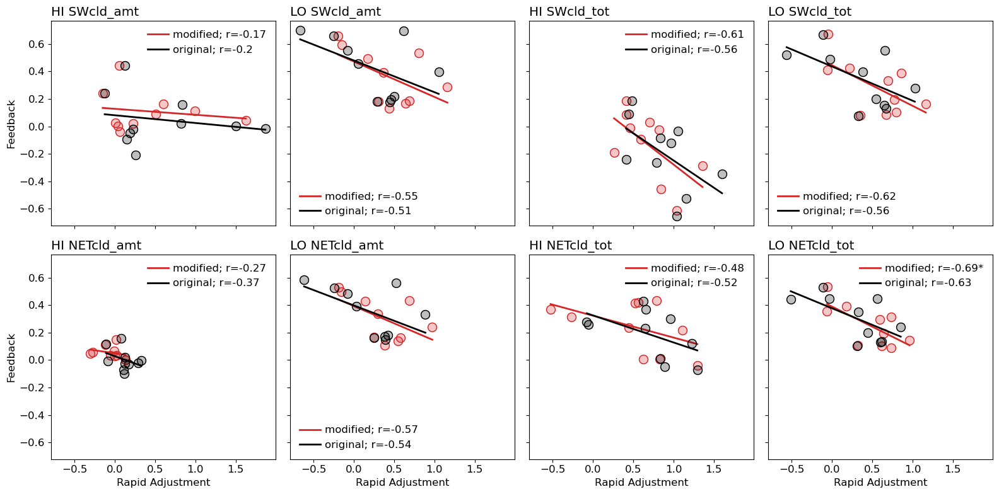

In [32]:
import json
ADJS = json.load(open('/p/user_pub/climate_work/zelinka1/cmip6/amip-4xCO2/AVGS.json'))
secs = ['trueHI','HI','trueLO','LO']
flavors = ['SWcld_amt','SWcld_tot','NETcld_amt','NETcld_tot']

fig, ax = plt.subplots(2,4,figsize=(16,8), sharey=True, sharex=True)
axs=ax.flatten()
adjmods = ADJS['HI']['modripfs']
fbkmods = AVGS['HI']['modripfs']
cnt=-1
for flavor in flavors:
    for sec in secs:
        if 'true' in sec:
            cnt+=1
            COL = 'C3'
            LAB = 'modified'
        else:
            COL = 'k'
            LAB = 'original'
        X = ADJS[sec][flavor]
        Y = AVGS[sec][flavor]
        x,y=[],[]
        for m,mod in enumerate(adjmods):
            try:
                i = fbkmods.index(mod)
            except:
                continue    
            # print(adjmods[m],fbkmods[i])
            x.append(X[m])
            y.append(Y[i])  
        m, b, r, p, std_err = linregress(x,y)
        if p<0.05:
            LABEL = LAB+'; r='+str(np.round(r,2))+'*'
        else:
            LABEL = LAB+'; r='+str(np.round(r,2))
        dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
        # plt.subplot(4,4,cnt)
        plt.sca(axs[cnt])
        plt.plot(dummy,m*dummy+b,COL,label=LABEL) 
        plt.plot(x,y,marker='o',ms=10,ls='',mec=COL,mfc=COL,alpha=0.25)
        plt.plot(x,y,marker='o',ms=10,ls='',mec=COL,mfc='None')   
        if 'true' in sec:
            continue
        else:
            plt.title(sec+' '+flavor,loc='left')
        if cnt>3:
            plt.xlabel('Rapid Adjustment')
        if cnt==0 or cnt==4:
            plt.ylabel('Feedback')
        plt.legend()
plt.tight_layout()

In [33]:
AVGS['LO']['modripfs']

['CCSM4.r1i1p1',
 'CNRM-CM5.r1i1p1',
 'CanAM4.r1i1p1',
 'HadGEM2-A.r1i1p1',
 'IPSL-CM5A-LR.r1i1p1',
 'IPSL-CM5B-LR.r1i1p1',
 'MIROC5.r1i1p1',
 'MPI-ESM-LR.r1i1p1',
 'MRI-CGCM3.r1i1p1',
 'BCC-CSM2-MR.r1i1p1f1',
 'CESM2.r1i1p1f1',
 'CNRM-CM6-1.r1i1p1f2',
 'CanESM5.r1i1p2f1',
 'E3SM-1-0.r2i1p1f1',
 'GFDL-CM4.r1i1p1f1',
 'GISS-E2-1-G.r1i1p1f1',
 'HadGEM3-GC31-LL.r5i1p1f3',
 'IPSL-CM6A-LR.r1i1p1f1',
 'MIROC6.r1i1p1f1',
 'MRI-ESM2-0.r1i1p1f1']

In [34]:
A = AVGS['LO']['NETcld_amt']
B = AVGS['trueLO']['NETcld_amt']
C = B-A
D = AVGS['HI']['NETcld_amt']
E = AVGS['trueHI']['NETcld_amt']
F = E-D
this = [A,B,C,D,E,F]
# pd.DataFrame(this)
pd.DataFrame(AVGS['trueLO'])

,LWcld_tot,SWcld_tot,NETcld_tot,LWcld_amt,SWcld_amt,NETcld_amt,LWcld_alt,SWcld_alt,NETcld_alt,LWcld_tau,SWcld_tau,NETcld_tau,LWcld_err,SWcld_err,NETcld_err,modripfs
0,0.030343,-0.073450,-0.043107,0.008065,-0.012776,-0.004710,0.021456,-0.011629,0.009827,-0.000316,-0.047984,-0.048300,0.001138,-0.001061,0.000077,CCSM4.r1i1p1
1,0.017488,-0.023725,-0.006236,-0.017908,0.123229,0.105321,0.026931,-0.012310,0.014621,0.008297,-0.134542,-0.126245,0.000168,-0.000102,0.000067,CNRM-CM5.r1i1p1
2,0.002640,0.280087,0.282727,-0.047275,0.390542,0.343267,0.040735,-0.018963,0.021771,0.006861,-0.090092,-0.083231,0.002320,-0.001400,0.000920,CanAM4.r1i1p1
3,-0.034275,0.185021,0.150746,-0.054611,0.316445,0.261834,0.007228,-0.004105,0.003123,0.013729,-0.127247,-0.113518,-0.000620,-0.000071,-0.000692,HadGEM2-A.r1i1p1
4,-0.023556,0.147951,0.124394,-0.032813,0.227876,0.195062,0.001312,-0.000606,0.000707,0.007813,-0.079516,-0.071704,0.000132,0.000197,0.000329,IPSL-CM5A-LR.r1i1p1
5,-0.052804,0.508845,0.456041,-0.073701,0.614451,0.540750,0.005228,-0.002966,0.002262,0.014947,-0.102645,-0.087698,0.000721,0.000005,0.000727,IPSL-CM5B-LR.r1i1p1
6,0.043894,0.132658,0.176552,-0.019224,0.226793,0.207569,0.059171,-0.028714,0.030457,0.003497,-0.064748,-0.061251,0.000451,-0.000674,-0.000222,MIROC5.r1i1p1
7,-0.018873,0.365379,0.346506,-0.074987,0.610174,0.535187,0.042648,-0.021315,0.021333,0.013379,-0.223138,-0.209759,0.000087,-0.000342,-0.000255,MPI-ESM-LR.r1i1p1
8,0.019774,0.073136,0.092910,-0.010019,0.107169,0.097150,0.017799,-0.008108,0.009690,0.010374,-0.024766,-0.014392,0.001621,-0.001160,0.000461,MRI-CGCM3.r1i1p1
9,0.002308,0.193357,0.195665,-0.024113,0.186840,0.162727,0.029382,-0.014734,0.014648,-0.002488,0.021024,0.018536,-0.000473,0.000226,-0.000246,BCC-CSM2-MR.r1i1p1f1


In [35]:
print(AVGS['trueLO']['SWcld_amt'].std(),AVGS['LO']['SWcld_amt'].std())
print(AVGS['trueHI']['SWcld_amt'].std(),AVGS['HI']['SWcld_amt'].std())
print(AVGS['trueLO']['NETcld_amt'].std(),AVGS['LO']['NETcld_amt'].std())
print(AVGS['trueHI']['NETcld_amt'].std(),AVGS['HI']['NETcld_amt'].std())


0.20410420320645692 0.2226886938951362
0.13889354222490288 0.22015972983610613
0.171021563498202 0.18821492531931946
0.05184861181552317 0.06555809239431568


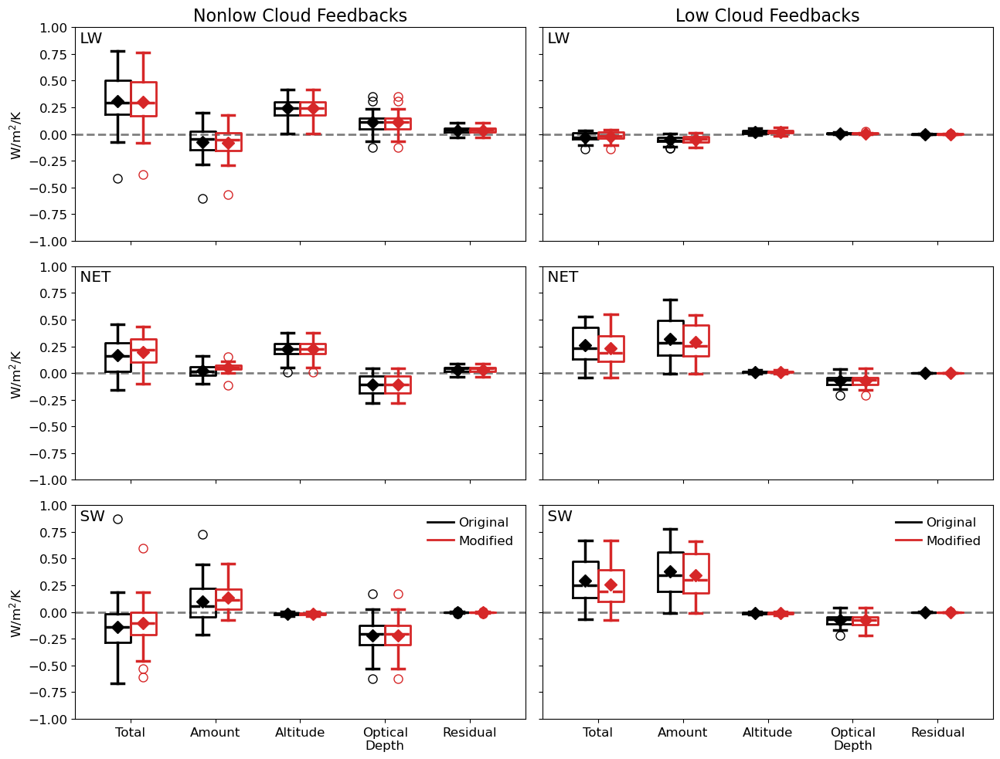

In [36]:
# NONLOW BOXPLOT 
boxprops0 = dict(color='k',lw=2)
meanpointprops0 = dict(marker='D', markeredgecolor='k',markerfacecolor='k',markersize=8)
medianprops0 = dict(linestyle='--', linewidth=2.5, color='k')
whiskerprops0 = dict(linestyle='-', linewidth=2.5, color='k')
capprops0 = dict(linestyle='-', linewidth=2.5, color='k')
flierprops0 = dict(marker='o', markeredgecolor='k',markerfacecolor='None',markersize=8)

boxprops = dict(color='C3',lw=2)
meanpointprops = dict(marker='D', markeredgecolor='C3',markerfacecolor='C3',markersize=8)
medianprops = dict(linestyle='--', linewidth=2.5, color='C3')
whiskerprops = dict(linestyle='-', linewidth=2.5, color='C3')
capprops = dict(linestyle='-', linewidth=2.5, color='C3')
flierprops = dict(marker='o', markeredgecolor='C3',markerfacecolor='None',markersize=8)

bands = ['LW','NET','SW']
flavors = ['tot','amt','alt','tau','err']
eng_flavors = ['Total','Amount','Altitude','Optical\nDepth','Residual']

fig, axs = plt.subplots(3,2,figsize=(13,10), sharey=True, sharex=True)

# NONLOW
handles = []
labels = []
cnt=-1
for b,band in enumerate(bands):
    cnt+=2
    plt.sca(axs[b,0])
    plt.axhline(y=0,color='gray',ls='--')
    for f,flav in enumerate(flavors):
        orig = AVGS['HI'][band+'cld_'+flav]
        adj = AVGS['trueHI'][band+'cld_'+flav]
        plt.boxplot(orig,positions=[f-0.15],widths=0.3,showmeans=True,boxprops=boxprops0,meanprops=meanpointprops0,medianprops=medianprops0,whiskerprops=whiskerprops0,capprops=capprops0,flierprops=flierprops0)
        plt.boxplot(adj,positions=[f+0.15],widths=0.3,showmeans=True,boxprops=boxprops,meanprops=meanpointprops,medianprops=medianprops,whiskerprops=whiskerprops,capprops=capprops,flierprops=flierprops)
    plt.title(' '+band,loc='left',y=0.9)
    if band=='LW':
        plt.title('Nonlow Cloud Feedbacks',loc='center',fontsize=16)
    plt.ylabel(UNITS)
    if cnt>4:
        plt.xticks(range(f+1),eng_flavors)
    else:
        plt.xticks(range(f+1),'')        
# Add handles and labels for the legend
handles.extend([plt.Line2D([0], [0], color='k', lw=2), plt.Line2D([0], [0], color='C3', lw=2)])
labels.extend(['Original', 'Modified'])
plt.legend(handles, labels, loc='upper right')

# LOW
handles = []
labels = []
cnt=0
for b,band in enumerate(bands):
    cnt+=2
    plt.sca(axs[b,1])
    plt.axhline(y=0,color='gray',ls='--')
    for f,flav in enumerate(flavors):
        orig = AVGS['LO'][band+'cld_'+flav]
        adj = AVGS['trueLO'][band+'cld_'+flav]
        plt.boxplot(orig,positions=[f-0.15],widths=0.3,showmeans=True,boxprops=boxprops0,meanprops=meanpointprops0,medianprops=medianprops0,whiskerprops=whiskerprops0,capprops=capprops0,flierprops=flierprops0)
        plt.boxplot(adj,positions=[f+0.15],widths=0.3,showmeans=True,boxprops=boxprops,meanprops=meanpointprops,medianprops=medianprops,whiskerprops=whiskerprops,capprops=capprops,flierprops=flierprops)
    plt.title(' '+band,loc='left',y=0.9)
    if band=='LW':
        plt.title('Low Cloud Feedbacks',loc='center',fontsize=16)
    # plt.ylabel(UNITS)
    if cnt>4:
        plt.xticks(range(f+1),eng_flavors)
    else:
        plt.xticks(range(f+1),'')        
plt.ylim(-1,1)
# Add handles and labels for the legend
handles.extend([plt.Line2D([0], [0], color='k', lw=2), plt.Line2D([0], [0], color='C3', lw=2)])
labels.extend(['Original', 'Modified'])
plt.legend(handles, labels, loc='upper right')
plt.tight_layout()
plt.savefig(figdir+'cld_fbk_boxplots.pdf',bbox_inches='tight')

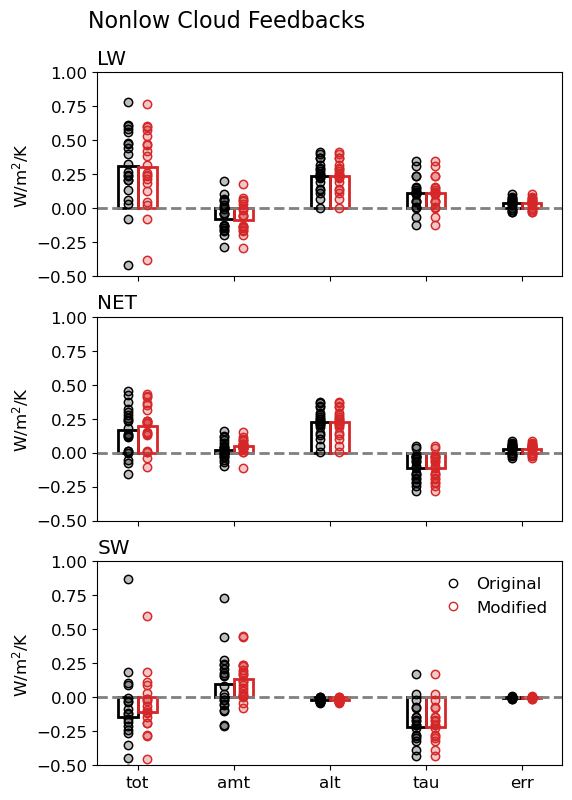

In [37]:
plt.figure(figsize=(6,9))
plt.suptitle('Nonlow Cloud Feedbacks',fontsize=16,x=0.11,y=0.95,ha='left')
bands = ['LW','NET','SW']
flavors = ['tot','amt','alt','tau','err']
cnt=0
handles = []
labels = []
for b,band in enumerate(bands):
    cnt+=1
    plt.subplot(3,1,cnt)
    plt.axhline(y=0,color='gray',ls='--')
    for f,flav in enumerate(flavors):
        orig = AVGS['HI'][band+'cld_'+flav]
        adj = AVGS['trueHI'][band+'cld_'+flav]
        handle_orig, = plt.plot(-0.1+f*np.ones(len(orig)),orig,marker='o',ls='',mec='k',mfc='k',alpha=0.25)
        handle_orig, = plt.plot(-0.1+f*np.ones(len(orig)),orig,marker='o',ls='',mec='k',mfc='None')
        # plt.plot(-0.1+f,np.average(orig),marker='o',ls='',mfc='k',mec='k')#,ms=10)
        plt.bar(-0.1+f,np.average(orig),width=0.2,edgecolor='k',facecolor='None',lw=2)
        handle_adj, = plt.plot(0.1+f*np.ones(len(adj)),adj,marker='o',ls='',mec='C3',mfc='C3',alpha=0.25)
        handle_adj, = plt.plot(0.1+f*np.ones(len(adj)),adj,marker='o',ls='',mec='C3',mfc='None')
        # plt.plot(0.1+f,np.average(adj),marker='o',ls='',mfc='C3',mec='C3')#,ms=10)
        plt.bar(0.1+f,np.average(adj),width=0.2,edgecolor='C3',facecolor='None',lw=2)
    plt.title(band,loc='left')
    plt.ylim(-0.5,1)
    plt.ylabel(UNITS)
    if cnt==3:
        plt.xticks(range(f+1),flavors)
    else:
        plt.xticks(range(f+1),'')
        
# Add handles and labels for the legend
handles.extend([handle_orig, handle_adj])
labels.extend(['Original', 'Modified'])
# Display the legend with only the first two entries
plt.legend(handles[:2], labels[:2])

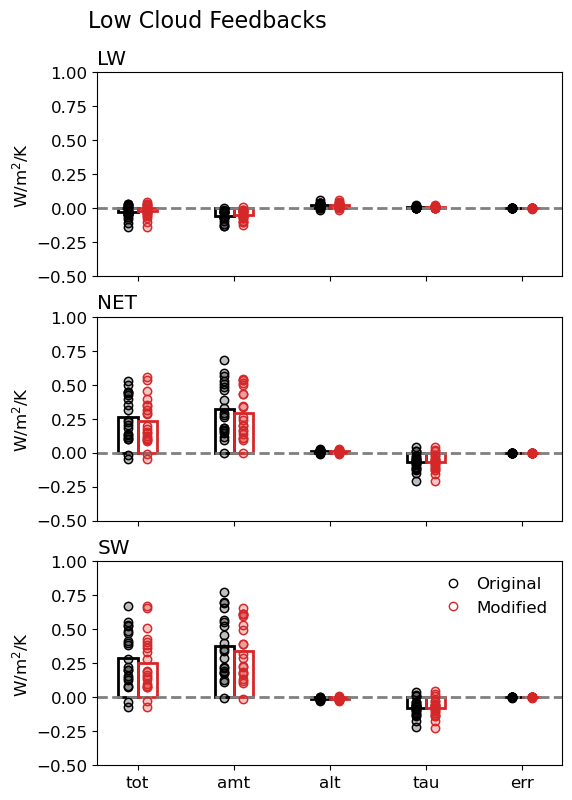

In [38]:
plt.figure(figsize=(6,9))
plt.suptitle('Low Cloud Feedbacks',fontsize=16,x=0.11,y=0.95,ha='left')
bands = ['LW','NET','SW']
flavors = ['tot','amt','alt','tau','err']
cnt=0
handles = []
labels = []
for b,band in enumerate(bands):
    cnt+=1
    plt.subplot(3,1,cnt)
    plt.axhline(y=0,color='gray',ls='--')
    for f,flav in enumerate(flavors):
        orig = AVGS['LO'][band+'cld_'+flav]
        adj = AVGS['trueLO'][band+'cld_'+flav]
        handle_orig, = plt.plot(-0.1+f*np.ones(len(orig)),orig,marker='o',ls='',mec='k',mfc='k',alpha=0.25)
        handle_orig, = plt.plot(-0.1+f*np.ones(len(orig)),orig,marker='o',ls='',mec='k',mfc='None')
        # plt.plot(-0.1+f,np.average(orig),marker='o',ls='',mfc='k',mec='k')#,ms=10)
        plt.bar(-0.1+f,np.average(orig),width=0.2,edgecolor='k',facecolor='None',lw=2)
        handle_adj, = plt.plot(0.1+f*np.ones(len(adj)),adj,marker='o',ls='',mec='C3',mfc='C3',alpha=0.25)
        handle_adj, = plt.plot(0.1+f*np.ones(len(adj)),adj,marker='o',ls='',mec='C3',mfc='None')
        # plt.plot(0.1+f,np.average(adj),marker='o',ls='',mfc='C3',mec='C3')#,ms=10)
        plt.bar(0.1+f,np.average(adj),width=0.2,edgecolor='C3',facecolor='None',lw=2)
    plt.title(band,loc='left')
    plt.ylim(-0.5,1)
    plt.ylabel(UNITS)
    if cnt==3:
        plt.xticks(range(f+1),flavors)
    else:
        plt.xticks(range(f+1),'')
        
# Add handles and labels for the legend
handles.extend([handle_orig, handle_adj])
labels.extend(['Original', 'Modified'])
# Display the legend with only the first two entries
plt.legend(handles[:2], labels[:2])

In [39]:
def stacked_barplot(x,y,negavg,posavg, **kwargs):#,WIDTH,COLOR,ALPHA,ZORDER,LABEL):
    if y<0:
        p1 = plt.bar(x, y, bottom=negavg, **kwargs)#, width=WIDTH, color=COLOR, alpha=ALPHA, zorder=ZORDER, label=LABEL)
        negavg+=y
    else:        
        p1 = plt.bar(x, y, bottom=posavg, **kwargs)#, width=WIDTH, color=COLOR, alpha=ALPHA, zorder=ZORDER, label=LABEL)
        posavg+=y
    return(negavg,posavg)

def stacked_barhplot(x,y,negavg,posavg, **kwargs):#,WIDTH,COLOR,ALPHA,ZORDER,LABEL):
    if y<0:
        p1 = plt.barh(x, y, left=negavg, **kwargs)#, width=WIDTH, color=COLOR, alpha=ALPHA, zorder=ZORDER, label=LABEL)
        negavg+=y
    else:        
        p1 = plt.barh(x, y, left=posavg, **kwargs)#, width=WIDTH, color=COLOR, alpha=ALPHA, zorder=ZORDER, label=LABEL)
        posavg+=y
    return(negavg,posavg)

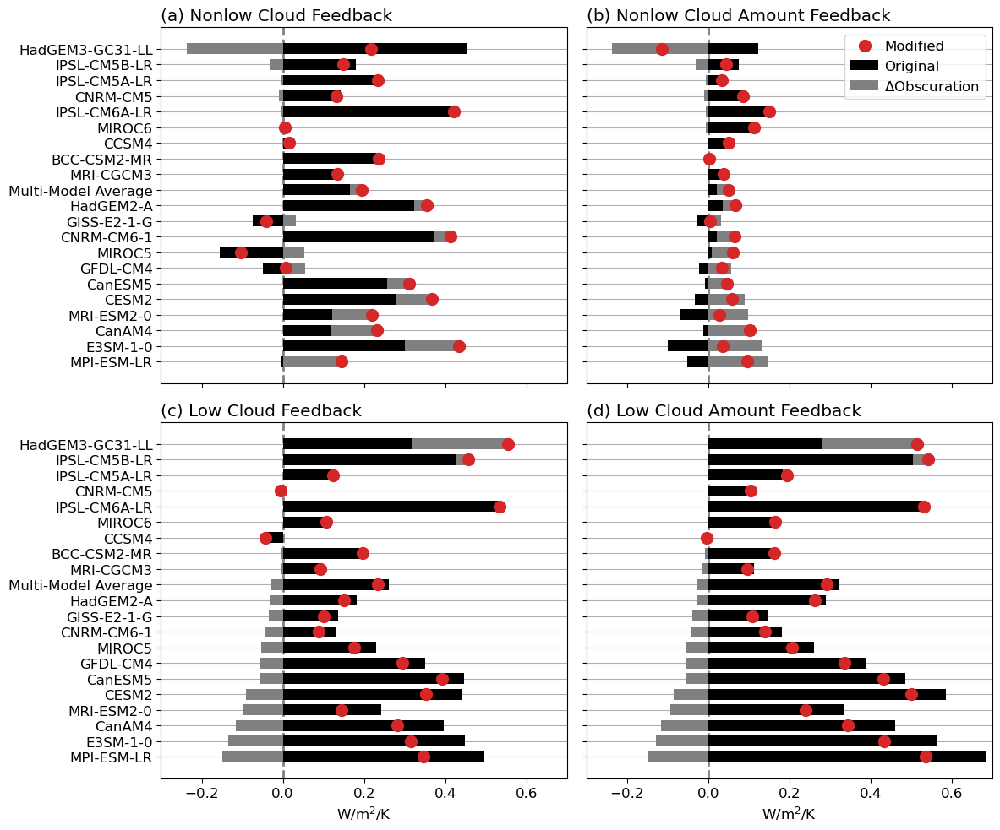

In [48]:
modripfs=modripfs5+modripfs6
# unobscured low cloud Adjustment = original low cloud Adjustment + change in obscuration
orig = AVGS['LO']['NETcld_amt']
adj_tot = AVGS['trueLO']['NETcld_amt']

# Tack on the multi-model means:       
orig = np.append(orig,np.average(orig))
adj_tot = np.append(adj_tot,np.average(adj_tot))
modripfs.append('Multi-Model Average')

dobcs = adj_tot-orig
inds = np.argsort(dobcs)

fig, axs = plt.subplots(2,2, figsize=(12,10), sharey=True, sharex=True)
cnt=-1
eng_sec=['Nonlow','Low']
eng_flav=['Cloud','Cloud Amount']
for r,sec in enumerate(['HI','LO']):
    for c,flav in enumerate(['tot','amt']):
        plt.sca(axs[r,c])
        # unobscured low cloud Adjustment = original low cloud Adjustment + change in obscuration
        orig = AVGS[sec]['NETcld_'+flav]
        adj_tot = AVGS['true'+sec]['NETcld_'+flav]
        # Tack on the multi-model means:       
        orig = np.append(orig,np.average(orig))
        adj_tot = np.append(adj_tot,np.average(adj_tot))
        dobcs = adj_tot-orig
        # inds = np.argsort(dobcs)
        mo=[]
        for i,m in enumerate(inds):
            mo.append(modripfs[m].split('.')[0])
            posavg=0
            negavg=0   
            if i==0:
                negavg,posavg = stacked_barhplot(i,orig[m],negavg,posavg,height=0.7,color='k',alpha=1,zorder=10,label='Original')    
                negavg,posavg = stacked_barhplot(i,dobcs[m],negavg,posavg,height=0.7,color='gray',alpha=1,zorder=10,label='$\Delta$Obscuration')    
                plt.plot(adj_tot[m],i,'o',color='C3',ms=10,zorder=20,label='Modified')
            else:
                negavg,posavg = stacked_barhplot(i,orig[m],negavg,posavg,height=0.7,color='k',alpha=1,zorder=10,label='_nolegend_')
                negavg,posavg = stacked_barhplot(i,dobcs[m],negavg,posavg,height=0.7,color='gray',alpha=1,zorder=10,label='_nolegend_')
                plt.plot(adj_tot[m],i,'o',color='C3',ms=10,zorder=20,label='_nolegend_')
        plt.axvline(x=0,ls='--',color='gray')    
        _=plt.yticks(np.arange(len(mo)),mo)
        cnt+=1
        let=string.ascii_lowercase[cnt]
        plt.title('('+let+') '+eng_sec[r]+' '+eng_flav[c]+' Feedback',loc='left')
        plt.grid(axis='y')
        if r>0:
            plt.xlabel(UNITS)
        if cnt==1:
            plt.legend(frameon=True)#loc='center left', bbox_to_anchor=(1, 0.5))
plt.xlim(-0.3,0.7)
plt.tight_layout()
plt.savefig(figdir+'cld_fbk_stacked_bars.pdf',bbox_inches='tight')

Text(0.0, 1.0, 'SW Cloud Amount Feedback')

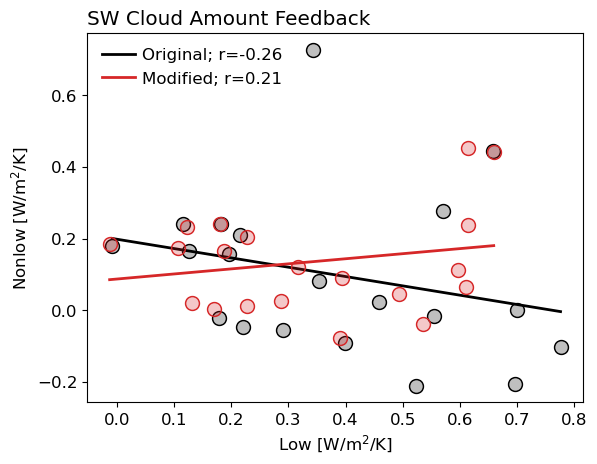

In [41]:
# The original high and low cloud amount feedbacks must be anti-correlated 
# such that the adjusted ones can both has less intermodel spread

hi_orig = AVGS['HI']['SWcld_amt']
lo_orig = AVGS['LO']['SWcld_amt']
hi_adj = AVGS['trueHI']['SWcld_amt']
lo_adj = AVGS['trueLO']['SWcld_amt']
x,y,lab = lo_orig,hi_orig,'Original'
m, b, r, p, std_err = linregress(x,y)
if p<0.05:
    LABEL = lab+'; r='+str(np.round(r,2))+'*'
else:
    LABEL = lab+'; r='+str(np.round(r,2))
dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
plt.plot(dummy,m*dummy+b,'k',label=LABEL)    
plt.plot(x,y,marker='o',ms=10,ls='',mec='k',mfc='k',alpha=0.25)
plt.plot(x,y,marker='o',ms=10,ls='',mec='k',mfc='None')

x,y,lab = lo_adj,hi_adj,'Modified'
m, b, r, p, std_err = linregress(x,y)
if p<0.05:
    LABEL = lab+'; r='+str(np.round(r,2))+'*'
else:
    LABEL = lab+'; r='+str(np.round(r,2))
dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
plt.plot(dummy,m*dummy+b,'C3',label=LABEL) 
plt.plot(x,y,marker='o',ms=10,ls='',mec='C3',mfc='C3',alpha=0.25)
plt.plot(x,y,marker='o',ms=10,ls='',mec='C3',mfc='None')   

plt.legend()
plt.ylabel('Nonlow [W/m$^2$/K]')
plt.xlabel('Low [W/m$^2$/K]')
plt.title('SW Cloud Amount Feedback',loc='left')

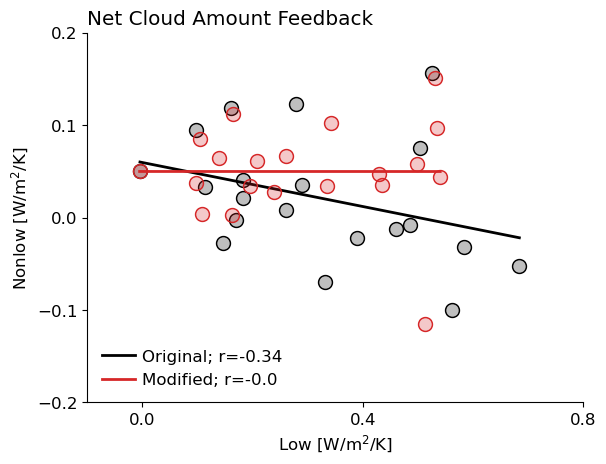

In [58]:
# The original high and low cloud amount feedbacks must be anti-correlated 
# such that the adjusted ones can both has less intermodel spread
hi_orig = AVGS['HI']['NETcld_amt']
lo_orig = AVGS['LO']['NETcld_amt']
hi_adj = AVGS['trueHI']['NETcld_amt']
lo_adj = AVGS['trueLO']['NETcld_amt']
x,y,lab = lo_orig,hi_orig,'Original'
m, b, r, p, std_err = linregress(x,y)
if p<0.05:
    LABEL = lab+'; r='+str(np.round(r,2))+'*'
else:
    LABEL = lab+'; r='+str(np.round(r,2))
dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
plt.plot(dummy,m*dummy+b,'k',label=LABEL)    
plt.plot(x,y,marker='o',ms=10,ls='',mec='k',mfc='k',alpha=0.25)
plt.plot(x,y,marker='o',ms=10,ls='',mec='k',mfc='None')

x,y,lab = lo_adj,hi_adj,'Modified'
m, b, r, p, std_err = linregress(x,y)
if p<0.05:
    LABEL = lab+'; r='+str(np.round(r,2))+'*'
else:
    LABEL = lab+'; r='+str(np.round(r,2))
dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
plt.plot(dummy,m*dummy+b,'C3',label=LABEL) 
plt.plot(x,y,marker='o',ms=10,ls='',mec='C3',mfc='C3',alpha=0.25)
plt.plot(x,y,marker='o',ms=10,ls='',mec='C3',mfc='None')   

plt.legend(loc=3)
plt.xlim(-0.1,0.8)
plt.ylim(-0.2,0.2)
plt.xticks(np.arange(0,1.2,0.4))
plt.yticks(np.arange(-0.2,0.3,0.1))
plt.ylabel('Nonlow [W/m$^2$/K]')
plt.xlabel('Low [W/m$^2$/K]')
plt.title('Net Cloud Amount Feedback',loc='left')

# Hide the top and right spines
ax = plt.gca()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.savefig(figdir+'hilo_cld_fbk_scat.pdf',bbox_inches='tight')

## Caldwellograms

In [43]:
import matplotlib as mpl
def caldwellogram(DATA,ax,cmax=''):

    sum_terms_std = np.ma.sum(DATA,1)

    DDOF=1
    totvar=np.var(sum_terms_std,ddof=DDOF) # always compare back to this to make sure math is right        
    try:
        cov_matrix0 = np.ma.cov(DATA.T,ddof=DDOF)
    except:
        cov_matrix0 = np.cov(DATA.T,ddof=DDOF)

    # take the values above the diagonal and multiply by 2, everywhere else=0    
    cov_matrix = 2*np.tril(cov_matrix0)
    
    # the diagonal contains the variance
    cols=DATA.shape[1]
    di = np.diag_indices(cols)
    cov_matrix[di] = cov_matrix0[di]    
    
    ti = np.triu_indices(cols,k=1) # mask out areas below the diagonal
    #ti = np.tril_indices(cols,k=-1) # mask out areas above the diagonal
    cov_matrix[ti] = -999
    cov_matrix=np.ma.masked_equal(cov_matrix,-999)

    print('total variance = '+str(totvar))
    print('sum covariance matrix = '+str(np.sum(cov_matrix)))
        
    thishist = cov_matrix/totvar
    if cmax=='':
        cmax=np.round(0.85*np.max(np.abs(thishist)),1)
    else:
        pass
    bounds=np.linspace(-cmax,cmax,11)
    #bounds=np.arange(-cmax,cmax+0.2,0.2)        
    bounds2=np.append(np.append(-150,bounds),150)
    
    # TEMPORARY:
    bounds2 = np.arange(-0.7,0.8,0.2)
    cmap = plt.cm.RdBu_r
    norm = mpl.colors.BoundaryNorm(bounds2, cmap.N)
    im1 = ax.pcolor(thishist,cmap='RdBu_r',norm=norm) # this must sum to 1.0
    for i in np.arange(cols):
        for j in np.arange(cols):
            #if j>i: # plot below the diagonal
            if j<i: # plot above the diagonal
                continue
            #data=round(thishist[j,i],2)
            data=thishist[j,i]
            if np.abs(data)>cmax/2.:
                cc='w'
            else:
                cc='k'
            ax.text(i+0.5,j+0.5,'%0.2f'%(data),color=cc,horizontalalignment='center',verticalalignment='center',fontweight='bold')

    return (bounds2,thishist)

Cloud feedback variance = 0.07572130535558579
total variance = 0.07577626968288463
sum covariance matrix = 0.0757762696828846
total variance = 0.07587429091828651
sum covariance matrix = 0.0758742909182865


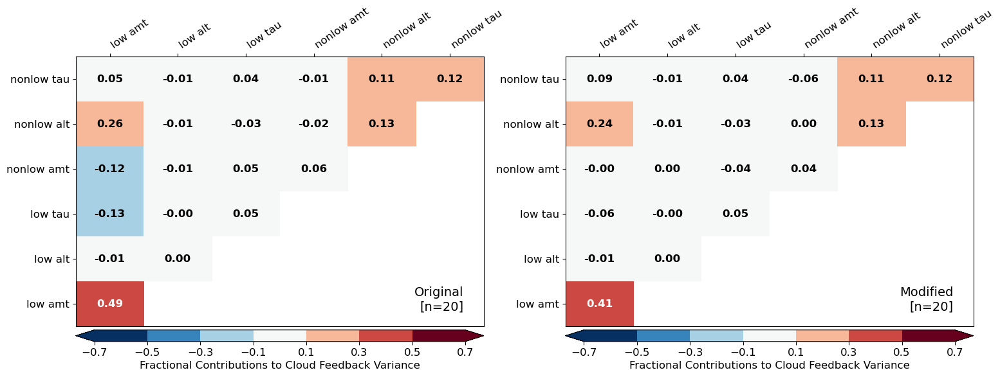

In [44]:
types=['amt','alt','tau']
# types=['tot']
LT = len(types)
original = np.zeros((2*LT,len(modripfs)))
modified = np.zeros((2*LT,len(modripfs)))
for f,fbk in enumerate(types):
    original[f,:] = AVGS['LO']['NETcld_'+fbk]
    modified[f,:] = AVGS['trueLO']['NETcld_'+fbk]
for f,fbk in enumerate(types):
    original[LT+f,:] = AVGS['HI']['NETcld_'+fbk]
    modified[LT+f,:] = AVGS['trueHI']['NETcld_'+fbk]

print('Cloud feedback variance = '+str(np.var(AVGS['ALL']['NETcld_tot'],ddof=1)))

# Do a caldwell-o-gram of cloud feedback components
fig=plt.figure(figsize=(18,12))
cmap = plt.cm.RdBu_r
types = ['low amt','low alt','low tau','nonlow amt','nonlow alt','nonlow tau']
# types = ['low','nonlow']
cols=len(types)
cmax=0.6
for t,txt in enumerate(['Original','Modified']):
    if txt=='Original':
        data = original.T
    else:
        data = modified.T
    ax=plt.subplot(2,2,t+1)
    bounds2,outcov = caldwellogram(data,ax,cmax) 
    ax.text(cols*.95,0.05*cols,txt+'\n[n='+str(np.sum(np.isfinite(data)[:,0]))+']',ha='right',va='bottom',fontsize=14)
    norm = mpl.colors.BoundaryNorm(bounds2, cmap.N)
    bounds=bounds2#[1:-1]
    plt.xticks(np.arange(0.5,cols+0.5,1))
    ax.set_xticklabels(types,fontsize=12,rotation=35,ha='left')
    plt.yticks(np.arange(0.5,cols+0.5,1), types,fontsize=12)# ,fontsize=14)
    ax.yaxis.tick_left()
    ax.xaxis.tick_top()
    he=np.array(ax.get_position())
    ax2 = fig.add_axes([he[0,0],   he[0,1]-0.02, he[1,0]-he[0,0],0.015])
    cb = mpl.colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm, ticks=bounds, boundaries=bounds2,orientation='horizontal',extend='both')  
    cb.set_label('Fractional Contributions to Cloud Feedback Variance')

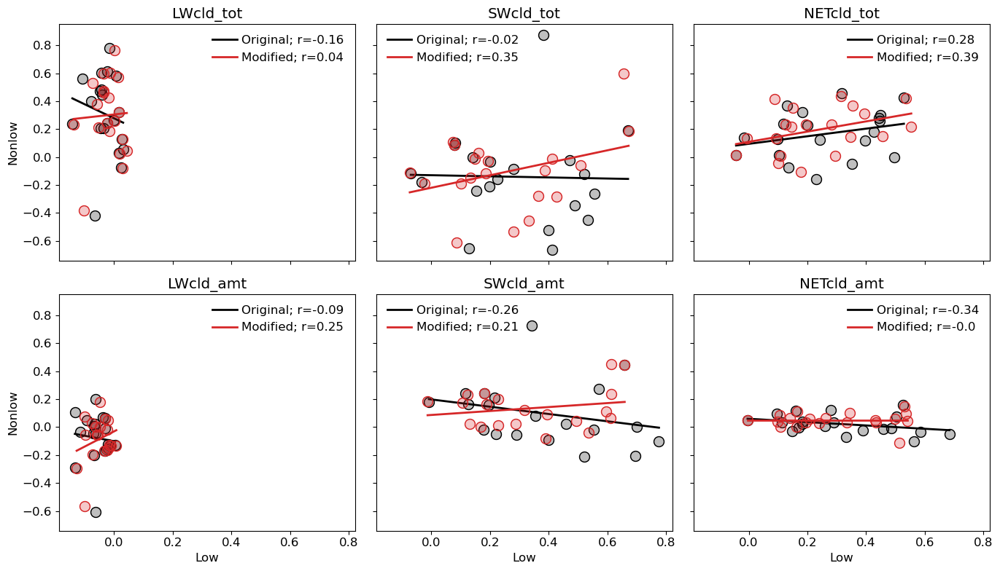

In [45]:
fig, ax = plt.subplots(2,3,figsize=(14,8), sharey=True, sharex=True)
axs=ax.flatten()
x,y=[],[]
cnt=-1
for fbk in list(AVGS['LO'].keys()):
    if 'amt' not in fbk and 'tot' not in fbk:
        continue
    cnt+=1
    plt.sca(axs[cnt])
    # plt.subplot(2,3,cnt)
    x = AVGS['LO'][fbk]
    y = AVGS['HI'][fbk]
    lab = 'Original'
    m, b, r, p, std_err = linregress(x,y)
    if p<0.05:
        LABEL = lab+'; r='+str(np.round(r,2))+'*'
    else:
        LABEL = lab+'; r='+str(np.round(r,2))
    dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
    plt.plot(dummy,m*dummy+b,'k',label=LABEL)    
    plt.plot(x,y,marker='o',ms=10,ls='',mec='k',mfc='k',alpha=0.25)
    plt.plot(x,y,marker='o',ms=10,ls='',mec='k',mfc='None')
    
    x = AVGS['trueLO'][fbk]
    y = AVGS['trueHI'][fbk]
    lab = 'Modified'
    m, b, r, p, std_err = linregress(x,y)
    if p<0.05:
        LABEL = lab+'; r='+str(np.round(r,2))+'*'
    else:
        LABEL = lab+'; r='+str(np.round(r,2))
    dummy=np.linspace(np.nanmin(x),np.nanmax(x),100)
    plt.plot(dummy,m*dummy+b,'C3',label=LABEL)    
    plt.plot(x,y,marker='o',ms=10,ls='',mec='C3',mfc='C3',alpha=0.25)
    plt.plot(x,y,marker='o',ms=10,ls='',mec='C3',mfc='None')
    plt.legend()
    plt.title(fbk)
    if cnt>2:
        plt.xlabel('Low')
    if cnt==0 or cnt==3:
        plt.ylabel('Nonlow')
plt.tight_layout()    

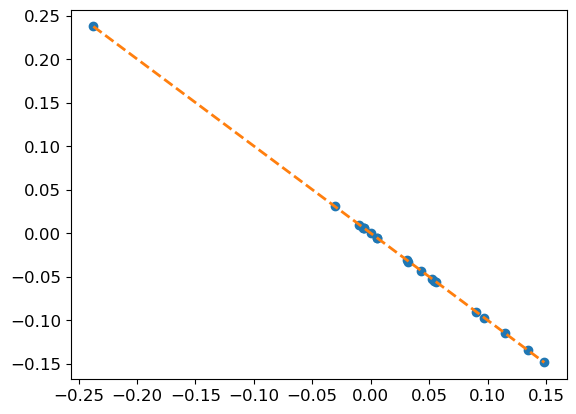

In [46]:
orig = AVGS['LO']['NETcld_tot']
adj_tot = AVGS['trueLO']['NETcld_tot']
lo_dobcs = adj_tot-orig
orig = AVGS['HI']['NETcld_tot']
adj_tot = AVGS['trueHI']['NETcld_tot']
hi_dobcs = adj_tot - orig
plt.plot(hi_dobcs,lo_dobcs,'o')
dummy=np.linspace(np.min(hi_dobcs),np.max(hi_dobcs),100)
plt.plot(dummy,-dummy,ls='--')